In [1]:
import gym
import torch
import gym_nav
import numpy as np

import sys
sys.path.append('../')
from evaluation import *
from model_evaluation import *
from trajectories import *
from shortcut_analysis import *
from explore_analysis import *

from tqdm import tqdm
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

In [2]:
from scipy.stats import ttest_ind

def shortcut_cluster_bootstrap_labels(res, bootstrap_n=100, p=0.05, select_n=100):
    '''
    Use bootstrapping to see which neurons tend to be the most involved
    in determining the difference in cluster labels between cluster 1 and 2
    '''
    labels, no_cluster = decompose_shortcut_trajectories(res)
    activ = res['activs']['shared_activations'][1]
    
    p_idxss = []

    for i in range(bootstrap_n):
        activ1 = activ[labels == 1]
        activ2 = activ[labels == 2]

        idxs1 = np.random.choice(np.arange(len(activ1)), select_n)
        idxs2 = np.random.choice(np.arange(len(activ2)), select_n)

        activ1 = activ1[idxs1]
        activ2 = activ2[idxs2]

        tt = ttest_ind(activ1, activ2)

        p_idxs = tt.pvalue < p
        p_idxss.append(p_idxs)

    comb_p_idx = np.full(p_idxs.shape, True)
    for i in range(bootstrap_n):
        comb_p_idx = comb_p_idx & p_idxss[i]
    
    return comb_p_idx

## Contributors to activation cluster differences

Should also consider cluster separations in different layers

In [124]:
len(activ[labels == 1])

1271

<a list of 1 Line2D objects>

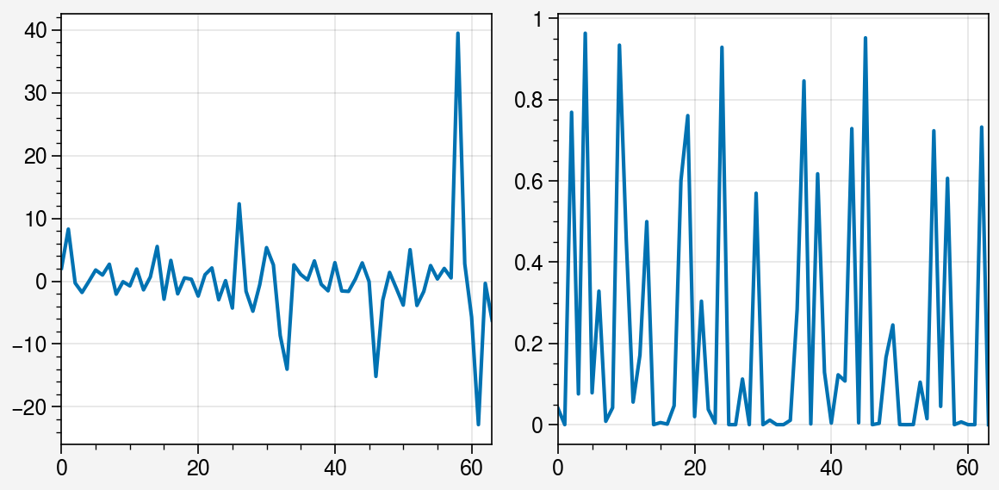

In [133]:
activ1 = activ[labels == 1]
activ2 = activ[labels == 2]

idxs1 = np.random.choice(np.arange(len(activ1)), 50)
idxs2 = np.random.choice(np.arange(len(activ2)), 50)

activ1 = activ1[idxs1]
activ2 = activ2[idxs2]

tt = ttest_ind(activ1, activ2)

fig, ax = pplt.subplots(ncols=2, sharey=False)
ax[0].plot(tt.statistic)

ax[1].plot(tt.pvalue)

**Method 1**

Find important nodes through bootstrapped t-test

In [179]:
res = shortcut_res[-1]
labels, no_cluster = decompose_shortcut_trajectories(res)
activ = res['activs']['shared_activations'][1]

comb_p_idx = shortcut_cluster_bootstrap_labels(res)
print(comb_p_idx.sum())

21


In [176]:
activ2d1 = UMAP(min_dist=0.75).fit_transform(activ[:, comb_p_idx])
activ2d2 = UMAP(min_dist=0.75).fit_transform(activ[:, ~comb_p_idx])

In [177]:
idxs1 = labels == 1
idxs2 = labels == 2

score1 = two_set_silhouette_score(activ2d1[idxs1], activ2d1[idxs2])
score2 = two_set_silhouette_score(activ2d2[idxs1], activ2d2[idxs2])

print(score1, score2)

0.40785012 0.14517818


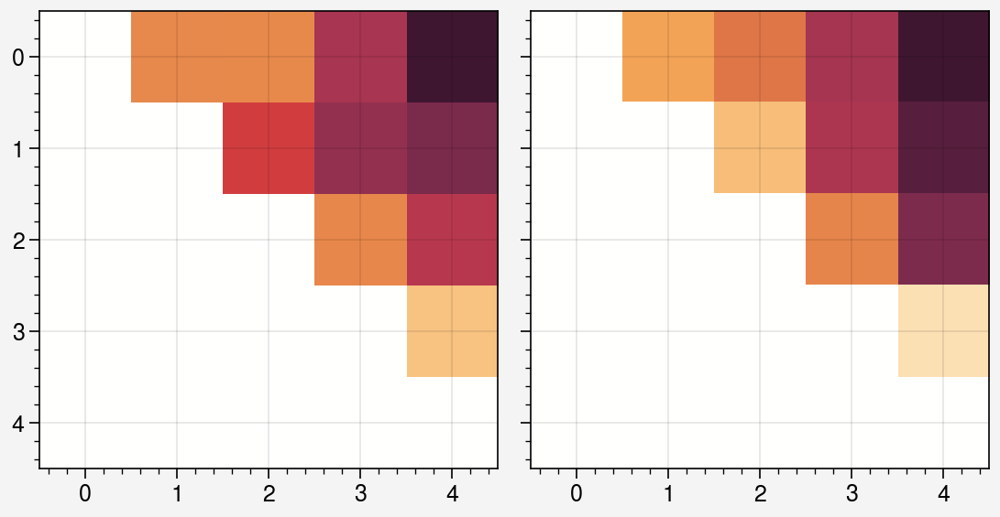

In [178]:
scores1 = pairwise_silhouette_score(activ2d1, labels)
scores2 = pairwise_silhouette_score(activ2d2, labels)

fig, ax = pplt.subplots(ncols=2)
ax[0].imshow(scores1)
ax[1].imshow(scores2)

**Method 2**

Find important nodes based on activation differences

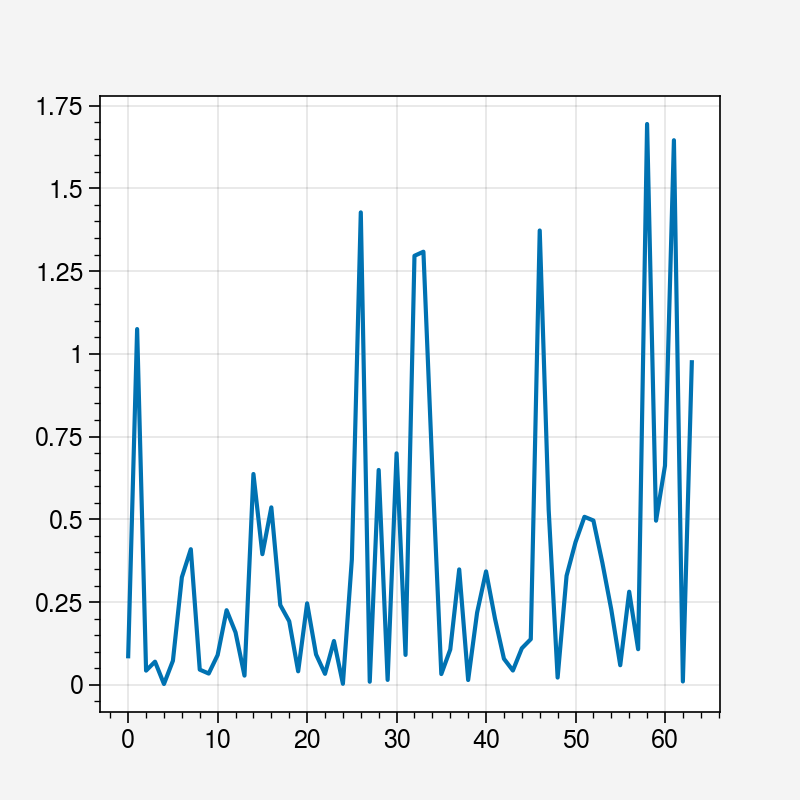

In [92]:
plt.plot(activ_diffs.abs())

In [ ]:
res = shortcut_res[-1]

labels, no_cluster = decompose_shortcut_trajectories(res)
silscore = pairwise_silhouette_score(res['activ2d'], labels)
activ_diffs = activ[labels == 1].mean(dim=0) - activ[labels == 2].mean(dim=0)

In [166]:
activ1 = activ[labels == 1]
activ2 = activ[labels == 2]

activ_diffs = activ1.mean(dim=0) - activ2.mean(dim=0)

In [170]:
diff_idx = activ_diffs.abs() > 0.5

activ2d1 = UMAP(min_dist=0.75).fit_transform(activ[:, diff_idx])
activ2d2 = UMAP(min_dist=0.75).fit_transform(activ[:, ~diff_idx])



In [171]:
idxs1 = labels == 1
idxs2 = labels == 2

score1 = two_set_silhouette_score(activ2d1[idxs1], activ2d1[idxs2])
score2 = two_set_silhouette_score(activ2d2[idxs1], activ2d2[idxs2])

print(score1, score2)

0.50239426 0.1525457


In [172]:
scores1 = pairwise_silhouette_score(activ2d1, labels)
scores2 = pairwise_silhouette_score(activ2d2, labels)

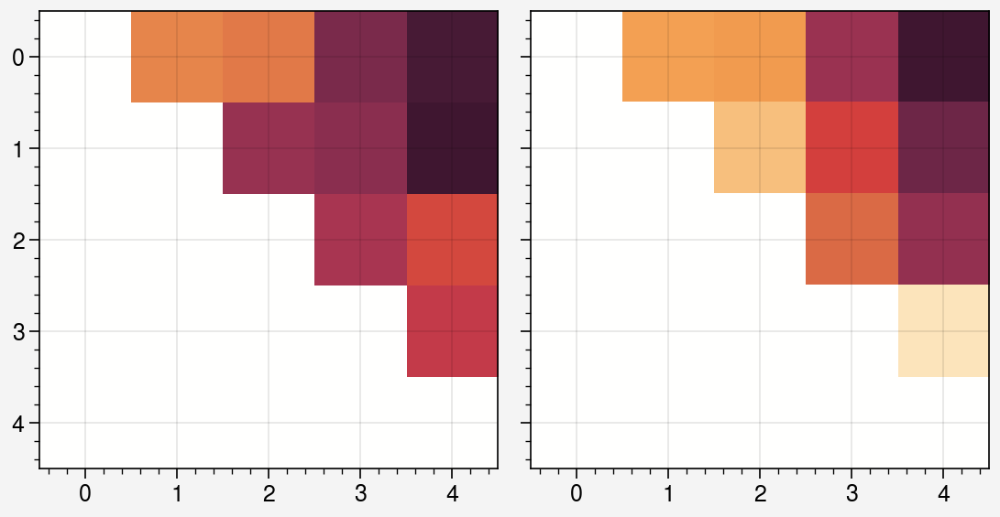

In [174]:
fig, ax = pplt.subplots(ncols=2)
ax[0].imshow(scores1)
ax[1].imshow(scores2)

**Crossover coefficient**

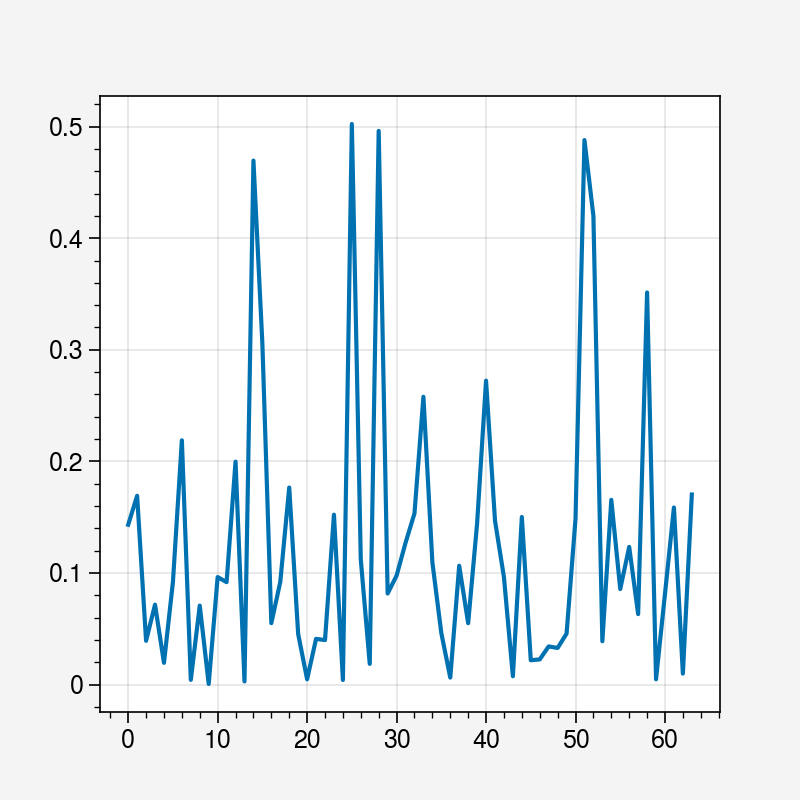

In [106]:
plt.plot(activ_stds.abs())

In [107]:
activ_stds = activ[(labels == 2) | (labels == 1)].std(dim=0)

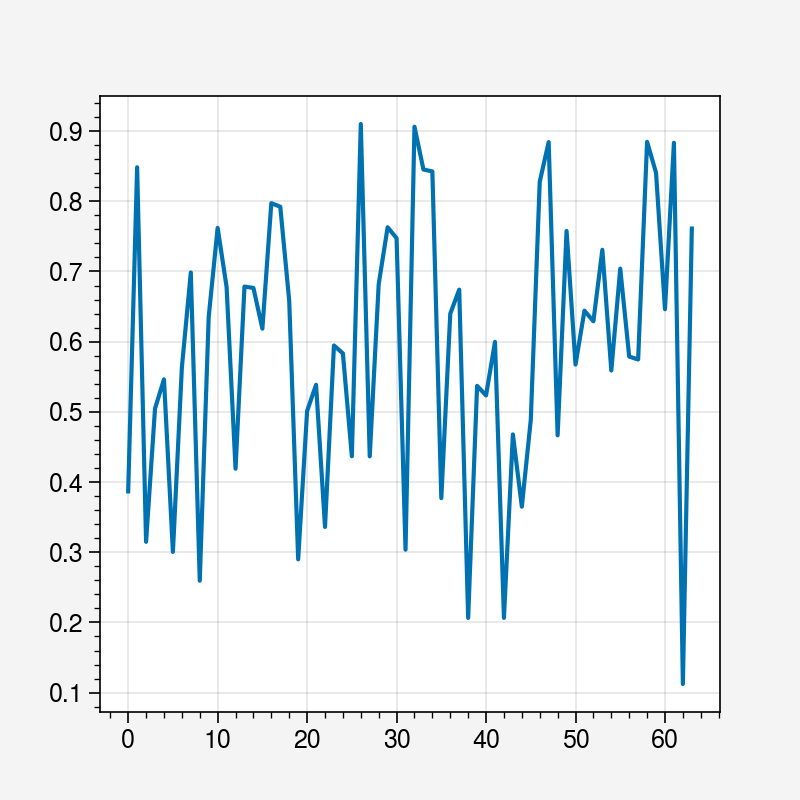

In [108]:
plt.plot(activ_stds)

In [96]:
(activ_diffs.abs() > 0.5).sum()

tensor(16)

In [21]:
res['activs'].keys()

dict_keys(['shared_activations', 'actor_activations', 'critic_activations'])

# Looking for most important nodes

In [58]:
batch = 64
p = 0.4
t = 0

shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied_longer/{batch}_{p}_{t}', 'rb'))
model, obs_rms = torch.load(f'../saved_models/shortcut_resets/shortcutnav_fcp{p}reset3batch{batch}_t{t}.pt')

res = shortcut_res[-1]
idxs = shortcut_cluster_bootstrap_labels(res)



In [113]:
idxss = []
for i in range(10):
    idxs = shortcut_cluster_bootstrap_labels(res, p=0.0005, select_n=50, bootstrap_n=500)
    idxss.append(idxs)
    


In [114]:
max_nodes = np.max([i.sum() for i in idxss])
max_idx = np.argmax([i.sum() for i in idxss])
# max_nodes = 8
# max_idx = 3
crossovers = []
for i in range(10):
    if i == max_idx:
        continue
    crossover = (idxss[max_idx] & idxss[i]).sum() / max_nodes
    crossovers.append(crossover)
print(crossovers)

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


In [115]:
max_nodes

8

## Degrading representations by resetting nodes

In [8]:
batch = 64
p = 0.4
t = 0

shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied_longer/{batch}_{p}_{t}', 'rb'))
model, obs_rms = torch.load(f'../saved_models/shortcut_resets/shortcutnav_fcp{p}reset3batch{batch}_t{t}.pt')

res = shortcut_res[-1]
idxs = shortcut_cluster_bootstrap_labels(res)



In [14]:
forced_res = test_shortcut_activations(model, obs_rms, forced_actions=True)

In [15]:
forced_res.keys()

dict_keys(['ep_pos', 'pos', 'angle', 'actions', 'activ2d', 'shortcut_avail', 'shortcut_used', 'pos_chunks', 'shortcut_use_rate'])

In [17]:
len(forced_res['pos']) / 100

45.65

In [ ]:
len(shortcut_res[0]['pos'])

4565

In [19]:
res = test_shortcut_activations(model, obs_rms)

In [20]:
len(res['pos'])/100

45.96

In [51]:
%run shortcut_analysis.py

In [32]:
[a.shape for a in model.base.gru.parameters()][:2]

[torch.Size([192, 64]), torch.Size([192, 64])]

In [160]:
model, obs_rms = torch.load(f'../saved_models/shortcut_resets/shortcutnav_fcp{p}reset3batch{batch}_t{t}.pt')
old_gru_params = list(model.base.gru.parameters()).copy()

In [161]:
num_degrades = [1, 2, 3, 5, 7, 10, 15]
trials = 3

performances = defaultdict(list)
degraded_idxs = defaultdict(list)

for degrade in tqdm(num_degrades):
    for trial in range(trials):
        # Return to old params
        for i, param in enumerate(model.base.gru.parameters()):
            param.requires_grad = False
            param.copy_(old_gru_params[i])
            param.requires_grad = True
        
        # Degrade random subset of parameters
        idxs2 = np.random.choice(np.arange(64), degrade)
        degraded_idxs[degrade].append(idxs2)
        params = list(model.base.gru.parameters())
        for idx in idxs2:
            for param in params[:2]:
                param.requires_grad = False
                # param[:, idx] = 0
                param[idx, :] = 0
                param[idx+64, :] = 0
                param[idx+128, :] = 0
                param.requires_grad = True
            list(model.base.gru.parameters())[0]
            
        res2 = test_shortcut_activations(model, obs_rms, test_only=True,
                                        skip_activs=False)
        performances[degrade].append(res2)

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [09:31<00:00, 81.63s/it]


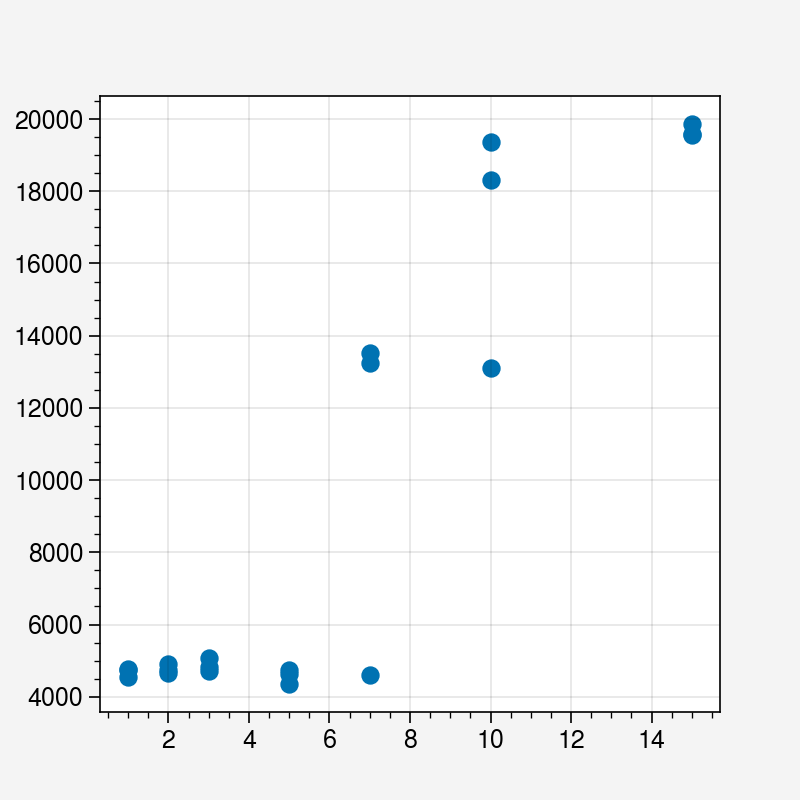

In [162]:
xs = []
ys = []
for degrade in num_degrades:
    for trial in range(trials):
        xs.append(degrade)
        ys.append(len(performances[degrade][trial]['pos']))
    
plt.scatter(xs, ys)
ax.format(xlabel='')

In [206]:
xs = []
ys = []
for degrade in num_degrades:
    for trial in range(trials):
        xs.append(degrade)
        ys.append(len(performances[degrade][trial]['pos']) / 100)
    
plt.scatter(xs, ys)
ax.format(xlabel='Number of nodes reset', ylabel='Time to reach platform')

NameError: name 'num_degrades' is not defined

In [119]:
res2 = performances[5][0]
activ2d = UMAP(min_dist=0.75).fit_transform(res2['activs']['shared_activations'][1])

In [171]:
((a[-2, :] == a[-1, :]) & (a[-10, :] == a[-1, :])).sum()

tensor(9)

In [173]:
degraded_idxs[1][0]

array([23])

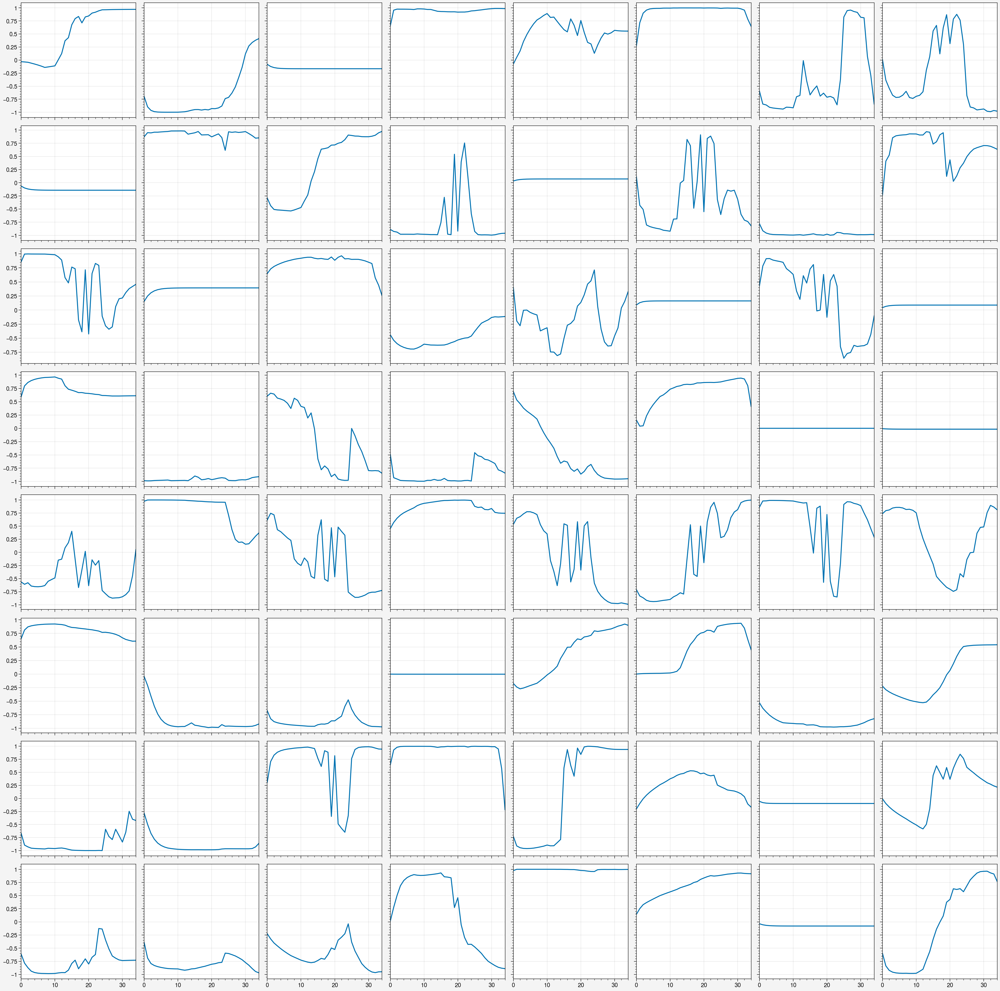

In [180]:
res2 = performances[3][0]

ep_lens = get_ep_lens(res2['ep_pos'])
activs = res2['activs']['shared_activations'][1]
ep_activs = ep_split_res(activs, ep_lens)
a = ep_activs[0]

fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(a[:, i])

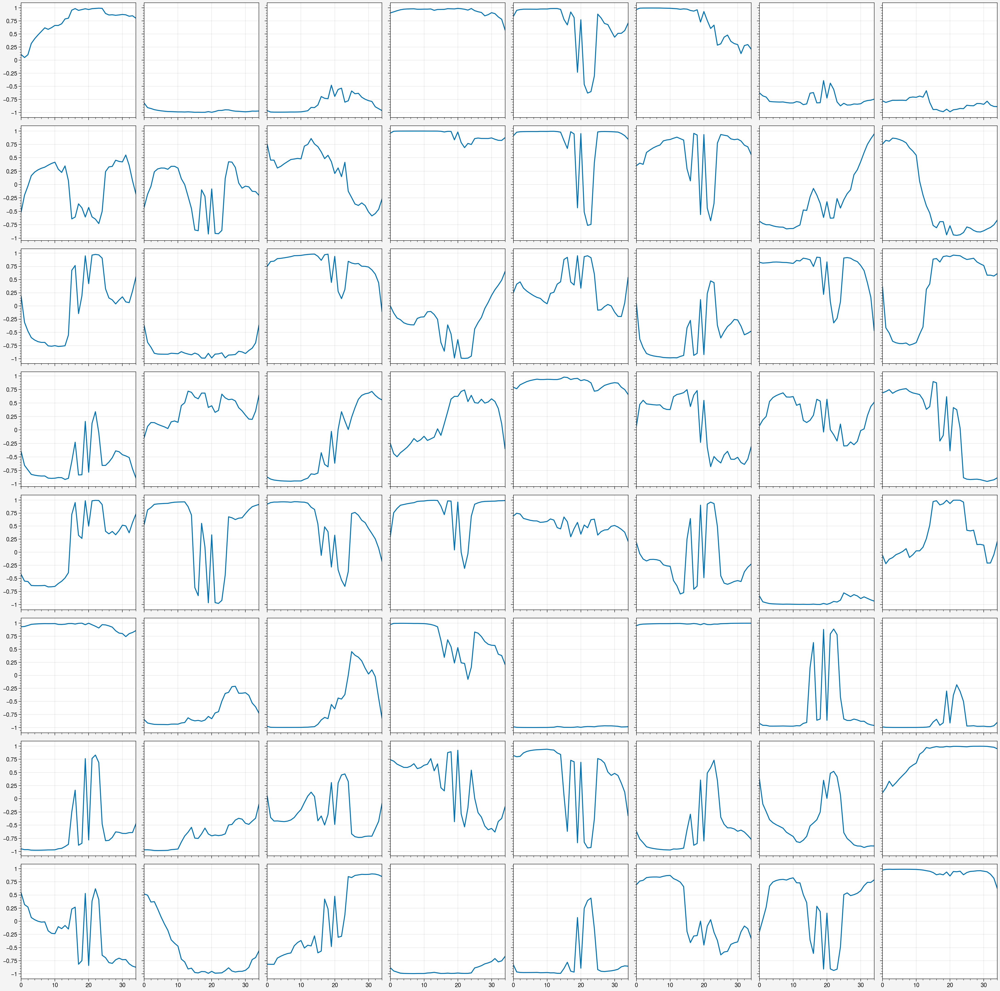

In [181]:
res2 = performances[3][0]

ep_lens = get_ep_lens(res2['ep_pos'])
activs = res2['activs']['actor_activations'][0]
ep_activs = ep_split_res(activs, ep_lens)
a = ep_activs[0]

fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(a[:, i])

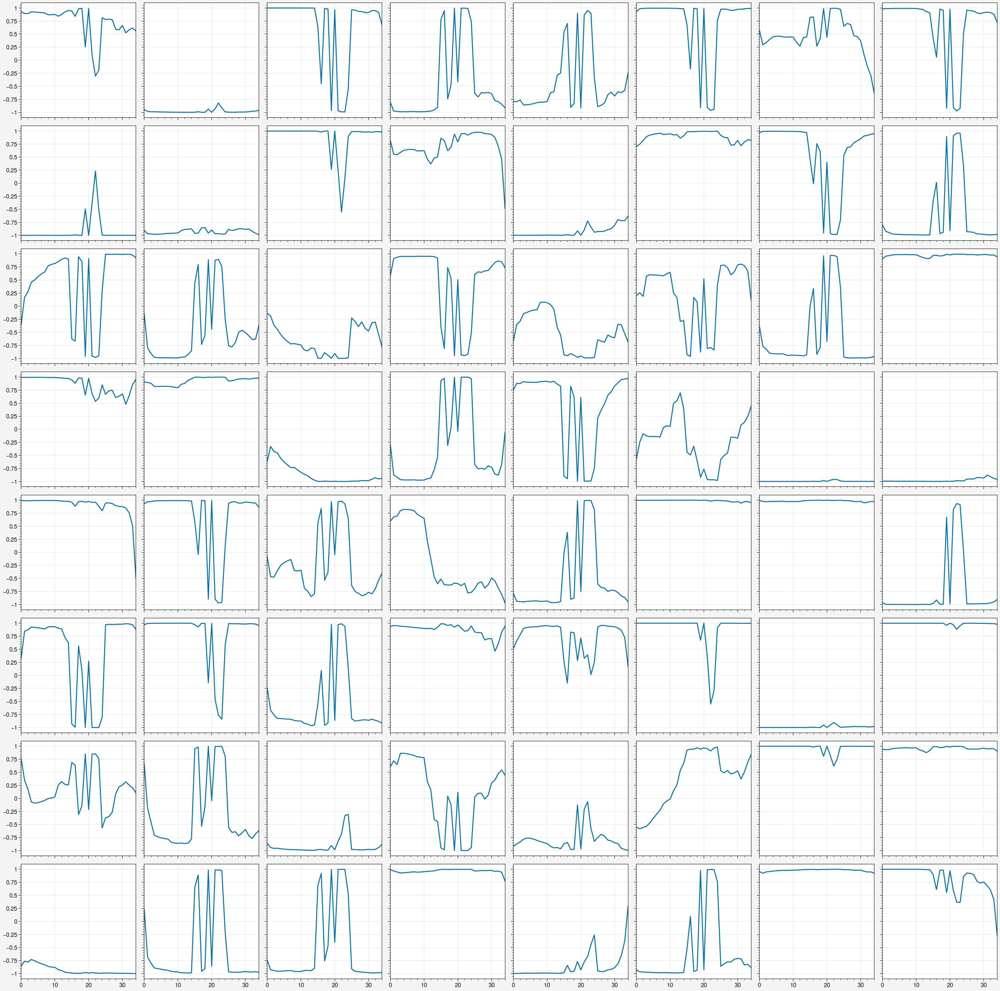

In [182]:
res2 = performances[3][0]

ep_lens = get_ep_lens(res2['ep_pos'])
activs = res2['activs']['actor_activations'][1]
ep_activs = ep_split_res(activs, ep_lens)
a = ep_activs[0]

fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(a[:, i])

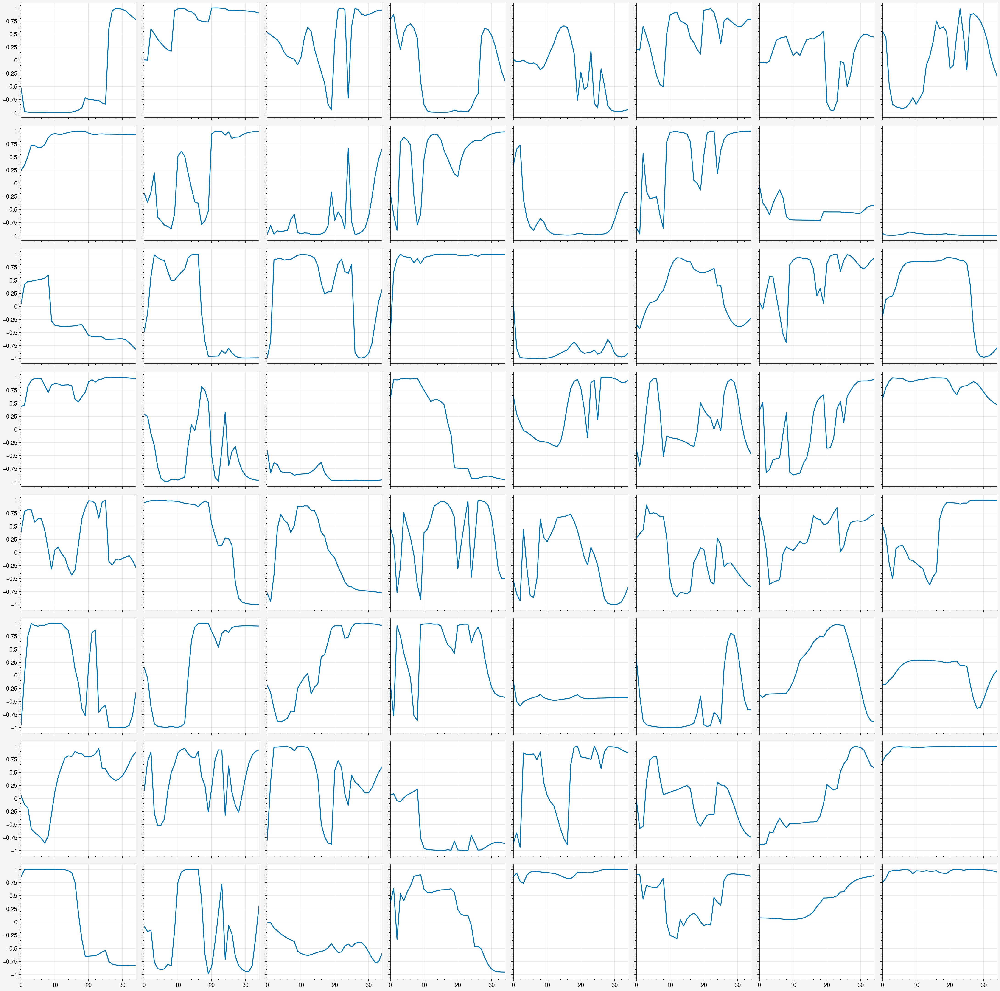

In [208]:
ep_lens = get_ep_lens(res['ep_pos'])
activs = res['activs']['shared_activations'][1]
ep_activs = ep_split_res(activs, ep_lens)
a = ep_activs[0]

fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(a[:, i])

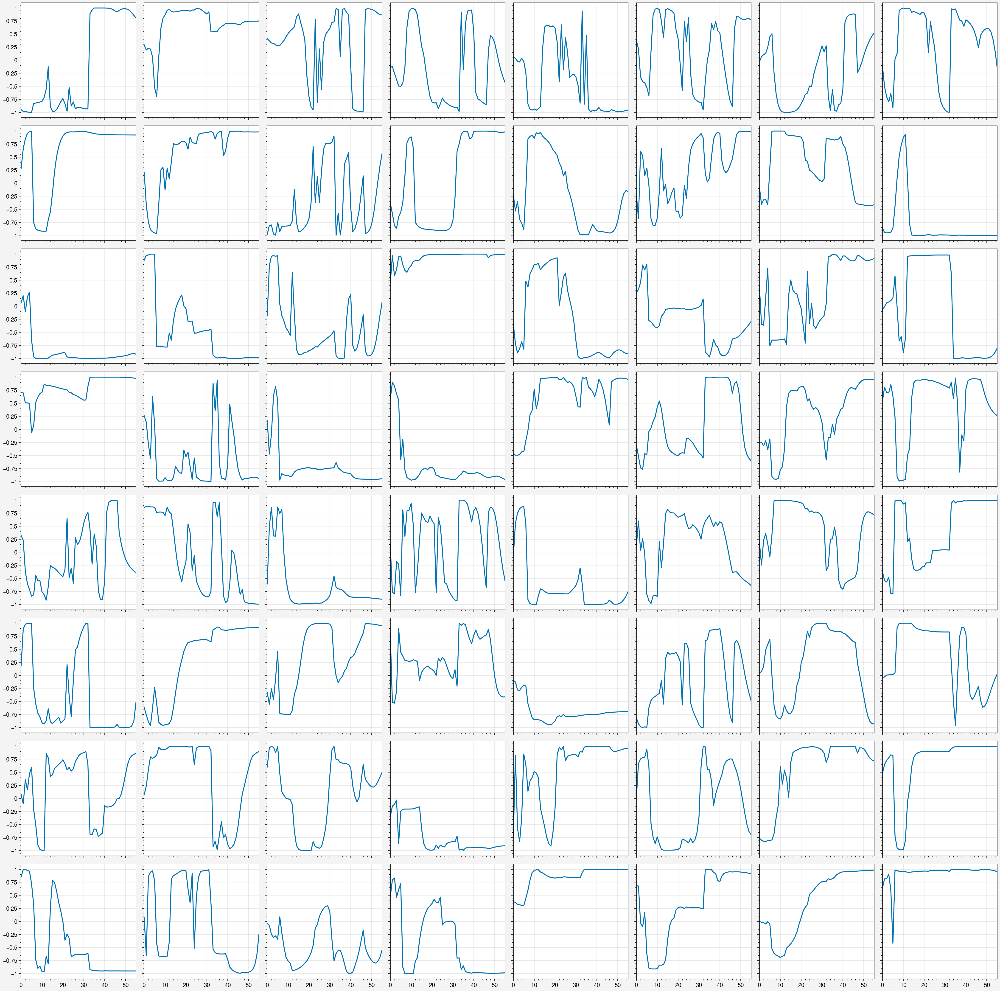

In [209]:
ep_lens = get_ep_lens(res['ep_pos'])
activs = res['activs']['shared_activations'][1]
ep_activs = ep_split_res(activs, ep_lens)
a = ep_activs[10]

fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(a[:, i])

In [178]:
res['activs']['shared_activations'][1].std(dim=0)

tensor([0.4268, 0.7620, 0.4402, 0.6923, 0.5913, 0.6564, 0.6271, 0.7384, 0.2802,
        0.7315, 0.7035, 0.8490, 0.4323, 0.6632, 0.8701, 0.6784, 0.7502, 0.8542,
        0.8323, 0.3652, 0.6460, 0.5341, 0.3182, 0.6582, 0.6598, 0.8277, 0.8348,
        0.5484, 0.9257, 0.7716, 0.7300, 0.6258, 0.8184, 0.7529, 0.7944, 0.4175,
        0.6635, 0.7457, 0.2686, 0.8486, 0.8322, 0.5939, 0.6165, 0.5038, 0.6920,
        0.5126, 0.6991, 0.8286, 0.9410, 0.8149, 0.6364, 0.5436, 0.6994, 0.7056,
        0.4975, 0.6946, 0.5013, 0.6212, 0.9141, 0.8724, 0.8424, 0.7898, 0.1934,
        0.8615])

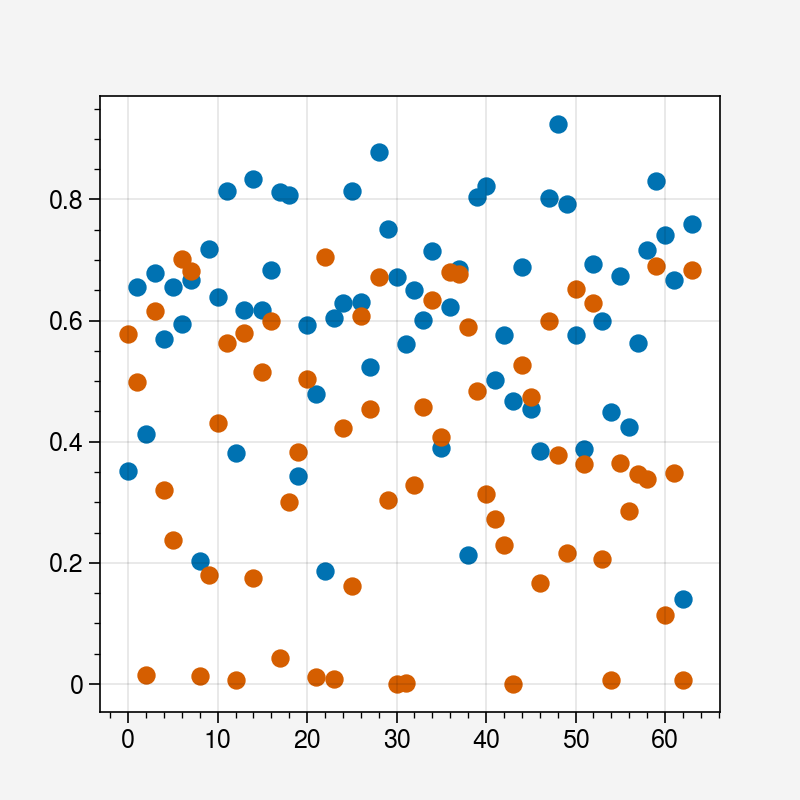

In [196]:
ep_lens = get_ep_lens(res['ep_pos'])
activs = res['activs']['shared_activations'][1]
ep_activs = ep_split_res(activs, ep_lens)
std1 = torch.vstack([a.std(dim=0) for a in ep_activs]).mean(dim=0)

ep_lens = get_ep_lens(res2['ep_pos'])
activs = res2['activs']['shared_activations'][1]
ep_activs = ep_split_res(activs, ep_lens)
std2 = torch.vstack([a.std(dim=0) for a in ep_activs]).mean(dim=0)

plt.scatter(range(64), std1)
plt.scatter(range(64), std2)

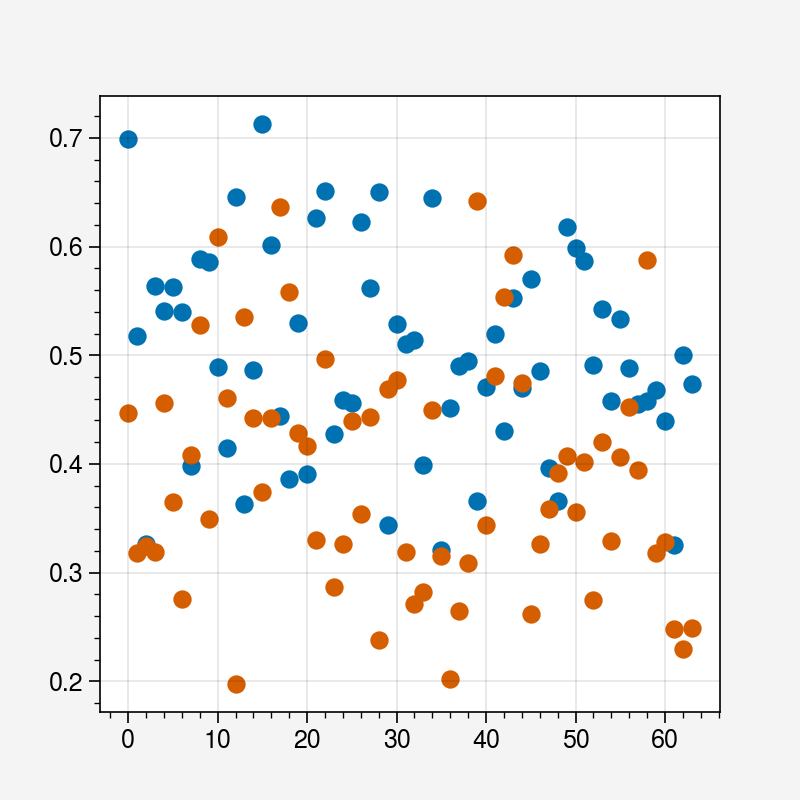

In [199]:
activ_type = 'critic_activations'
layer = 0

ep_lens = get_ep_lens(res['ep_pos'])
activs = res['activs'][activ_type][layer]
ep_activs = ep_split_res(activs, ep_lens)
std1 = torch.vstack([a.std(dim=0) for a in ep_activs]).mean(dim=0)

ep_lens = get_ep_lens(res2['ep_pos'])
activs = res2['activs'][activ_type][layer]
ep_activs = ep_split_res(activs, ep_lens)
std2 = torch.vstack([a.std(dim=0) for a in ep_activs]).mean(dim=0)

plt.scatter(range(64), std1)
plt.scatter(range(64), std2)

## Targetted neuron degradation

In [205]:
batch = 64
p = 0.4
t = 0

shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{batch}_{p}_{t}', 'rb'))
model, obs_rms = torch.load(f'../saved_models/shortcut_resets/shortcutnav_fcp{p}reset3batch{batch}_t{t}.pt')

res = shortcut_res[-1]
target_idxs = shortcut_cluster_bootstrap_labels(res, p=0.005, select_n=50, bootstrap_n=500)

model, obs_rms = torch.load(f'../saved_models/shortcut_resets/shortcutnav_fcp{p}reset3batch{batch}_t{t}.pt')
old_gru_params = list(model.base.gru.parameters()).copy()

In [201]:
test_shortcut_use_rate(model, obs_rms)

0.85

In [211]:
target_idxs = np.argwhere(target_idxs).reshape(-1)

array([50, 24,  3, 40, 57], dtype=int64)

In [240]:
degrade = 5
trials = 5

random_degrade_res = []
random_degrade_idxs = []
random_degrade_sur = []

target_degrade_res = []
target_degrade_idxs = []
target_degrade_sur = []

'''Random'''
for trial in tqdm(range(trials)):
    # Return to old params
    for i, param in enumerate(model.base.gru.parameters()):
        param.requires_grad = False
        param.copy_(old_gru_params[i])
        param.requires_grad = True

    # Degrade random subset of parameters
    idxs2 = np.random.choice(np.arange(64), degrade, replace=False)
    params = list(model.base.gru.parameters())
    for idx in idxs2:
        # ! Could also look into zeroing the bias as well
        for param in params[:2]:
            param.requires_grad = False
            param[idx, :] = 0
            param[idx+64, :] = 0
            param[idx+128, :] = 0
            param.requires_grad = True
        list(model.base.gru.parameters())[0]

    res2 = test_shortcut_activations(model, obs_rms, test_only=True,
                                    skip_activs=False)
    sur = test_shortcut_use_rate(model, obs_rms)
    
    random_degrade_res.append(res2)
    random_degrade_idxs.append(idxs2)
    random_degrade_sur.append(sur)
    
'''Targetted'''
for trial in tqdm(range(trials)):
    # Return to old params
    for i, param in enumerate(model.base.gru.parameters()):
        param.requires_grad = False
        param.copy_(old_gru_params[i])
        param.requires_grad = True

    # Degrade random subset of parameters
    idxs2 = np.random.choice(target_idxs, degrade, replace=False)
    params = list(model.base.gru.parameters())
    for idx in idxs2:
        # ! Could also look into zeroing the bias as well
        for param in params[:2]:
            param.requires_grad = False
            param[idx, :] = 0
            param[idx+64, :] = 0
            param[idx+128, :] = 0
            param.requires_grad = True
        list(model.base.gru.parameters())[0]

    res2 = test_shortcut_activations(model, obs_rms, test_only=True,
                                    skip_activs=False)
    sur = test_shortcut_use_rate(model, obs_rms)
    
    target_degrade_res.append(res2)
    target_degrade_idxs.append(idxs2)
    target_degrade_sur.append(sur)


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:21<00:00, 28.26s/it]


In [222]:
print(np.mean(random_degrade_sur))
print(np.mean(target_degrade_sur))

0.8819999999999999
0.75


In [223]:
print(random_degrade_sur)
print(target_degrade_sur)

[0.86, 0.94, 0.92, 0.86, 0.83]
[0.77, 0.78, 0.82, 0.72, 0.66]


In [241]:
print(np.mean(random_degrade_sur))
print(np.mean(target_degrade_sur))

0.812
0.8019999999999999


In [242]:
print(random_degrade_sur)
print(target_degrade_sur)

[0.86, 0.86, 0.82, 0.75, 0.77]
[0.81, 0.85, 0.81, 0.77, 0.77]


In [245]:
surs = []
for res in random_degrade_res:
    sur = np.sum(res['ep_shortcut_used'])/np.sum(res['ep_shortcut_avail'])
    surs.append(sur)
print(surs)
surs = []
for res in target_degrade_res:
    sur = np.sum(res['ep_shortcut_used'])/np.sum(res['ep_shortcut_avail'])
    surs.append(sur)
print(surs)

[0.8571428571428571, 0.8541666666666666, 0.8235294117647058, 0.76, 0.8448275862068966]
[0.7924528301886793, 0.8333333333333334, 0.7857142857142857, 0.8, 0.8409090909090909]


In [226]:
res = target_degrade_res[0]
activ = res['activs']['shared_activations'][1]
activ2d = UMAP(min_dist=0.75).fit_transform(activ)

In [255]:
%run shortcut_analysis

In [232]:
shortcut_used = [check_shortcut_usage(p) for p in res['ep_pos']]

In [235]:
np.sum(shortcut_used) / 50

0.9

In [258]:
scores1 = []
for res in random_degrade_res:
    activ = res['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.75).fit_transform(activ)
    labels, no_cluster = decompose_shortcut_trajectories(res)

    idxs1, idxs2 = labels == 1, labels == 2
    score = two_set_silhouette_score(activ2d[idxs1], activ2d[idxs2])
    scores1.append(score)
    
scores2 = []
for res in target_degrade_res:
    activ = res['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.75).fit_transform(activ)
    labels, no_cluster = decompose_shortcut_trajectories(res)

    idxs1, idxs2 = labels == 1, labels == 2
    score = two_set_silhouette_score(activ2d[idxs1], activ2d[idxs2])
    scores2.append(score)
    
plt.boxplot([scores1, scores2])
print(scores1)
print(scores2)

{'whiskers': [<matplotlib.lines.Line2D at 0x1a410c94490>,
 'caps': [<matplotlib.lines.Line2D at 0x1a413bd5d90>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a41bb7a1f0>,
 'medians': [<matplotlib.lines.Line2D at 0x1a40c69b4c0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1a40c69bf70>,
 'means': []}

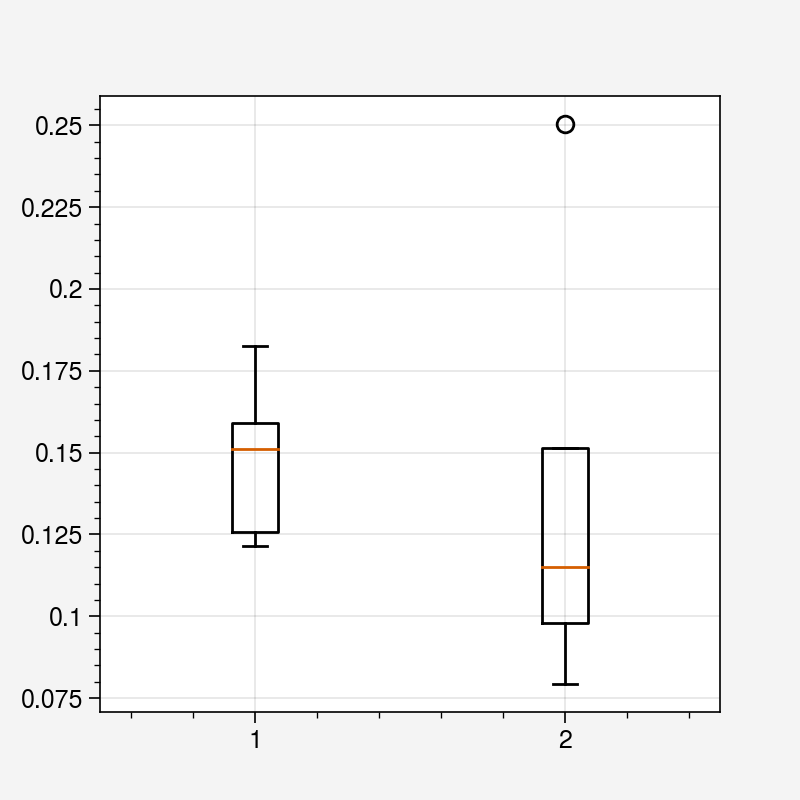

In [260]:
plt.boxplot([scores1, scores2])

In [262]:
scores = []
for i in range(5):
    res = random_degrade_res[0]
    activ = res['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.75).fit_transform(activ)
    labels, no_cluster = decompose_shortcut_trajectories(res)
    
    idxs1, idxs2 = labels == 1, labels == 2
    score = two_set_silhouette_score(activ2d[idxs1], activ2d[idxs2])
    scores.append(score)


[0.117261894, 0.22574933, 0.13134181, 0.13516375, 0.1183383]


{'whiskers': [<matplotlib.lines.Line2D at 0x1a4102a8ee0>,
 'caps': [<matplotlib.lines.Line2D at 0x1a41210a940>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a41721fb20>],
 'medians': [<matplotlib.lines.Line2D at 0x1a41210a1c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a40d3a5100>],
 'means': []}

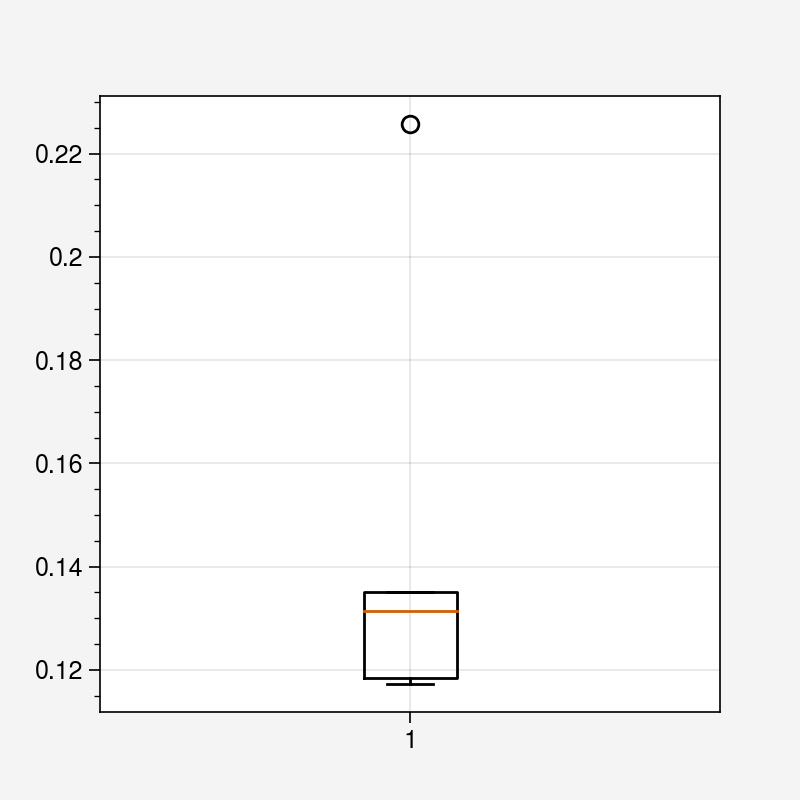

In [263]:
print(scores)
plt.boxplot([scores])

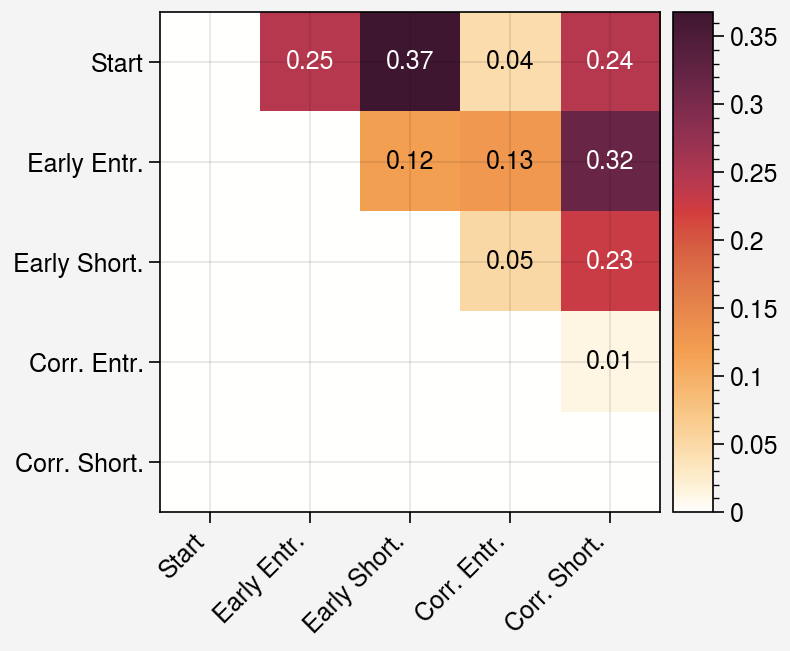

In [266]:
scores = pairwise_silhouette_score(activ2d, labels)
pairwise_silscore_plot(scores)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:42<00:00,  8.41s/it]


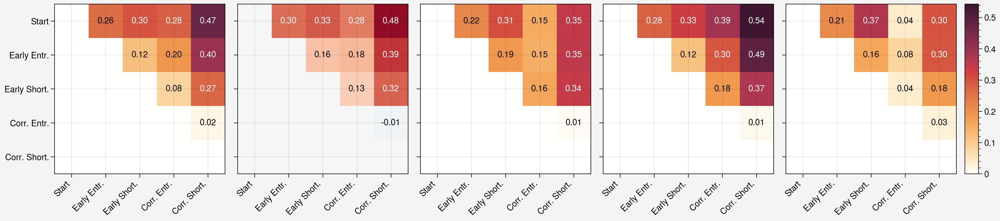

In [278]:

fig, ax = pplt.subplots(ncols=5)

silscores = []
activ2ds = []
for i in tqdm(range(5)):
    res = random_degrade_res[0]
    activ = res['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.5).fit_transform(activ)
    labels, no_cluster = decompose_shortcut_trajectories(res)
    
    silscore = pairwise_silhouette_score(activ2d, labels)
    silscores.append(silscore)
    activ2ds.append(activ2d)

max_score = np.vstack(silscores).max()
for i in range(5):
    cbar = pairwise_silscore_plot(silscores[i], ax=ax[i], vmax=max_score, draw_cbar=False)
fig.colorbar(cbar)

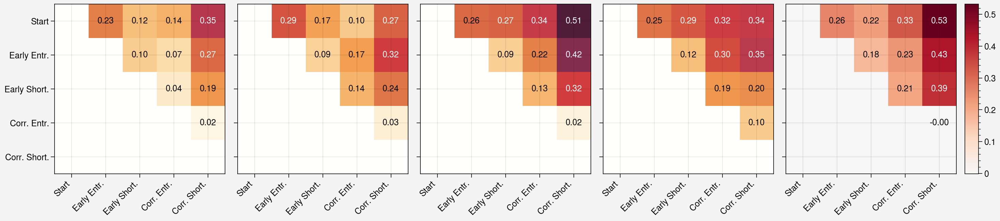

In [277]:
fig, ax = pplt.subplots(ncols=5)

for i in range(5):
    cbar = pairwise_silscore_plot(silscores[i], ax=ax[i], vmax=max_score, draw_cbar=False)
fig.colorbar(cbar)

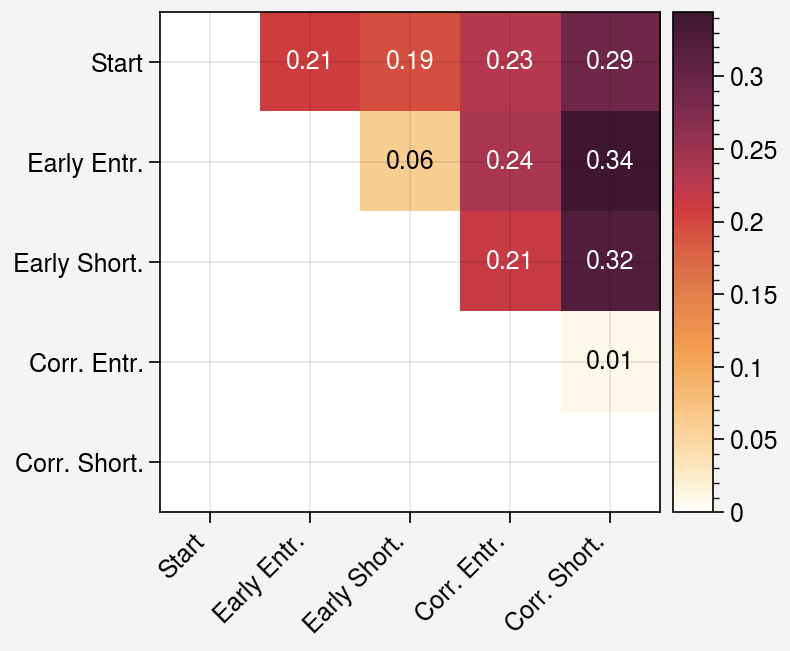

In [280]:
score = pairwise_silhouette_score(activ, labels)
pairwise_silscore_plot(score)

[0.06016098, 0.063407846, 0.060793858, 0.059456863, 0.052476715]
[0.052259386, 0.043372057, 0.045508564, 0.05656751, 0.05659375]


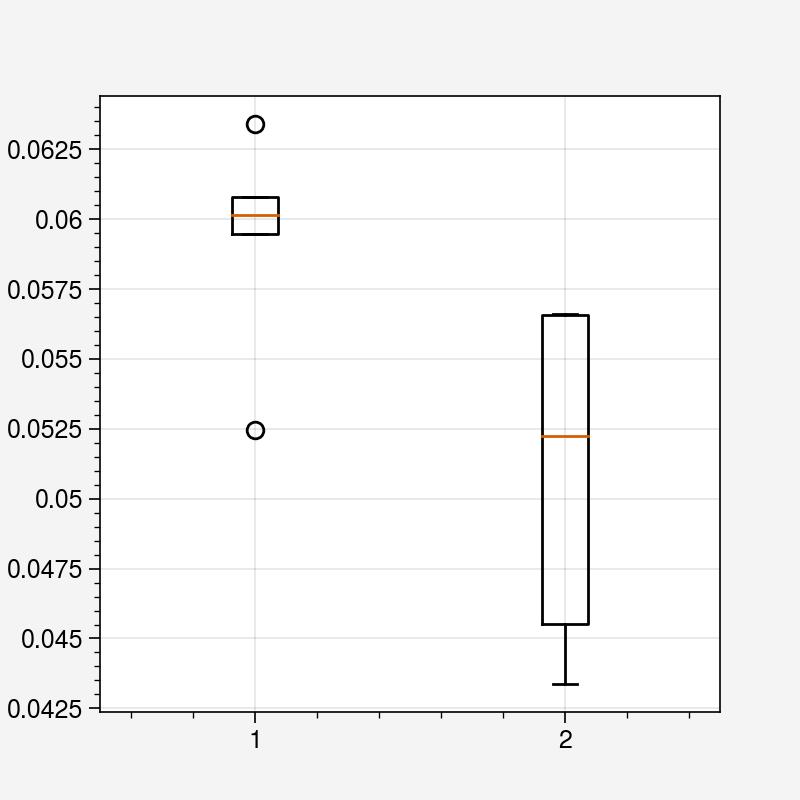

In [281]:
scores1 = []
for res in random_degrade_res:
    activ = res['activs']['shared_activations'][1]
    labels, no_cluster = decompose_shortcut_trajectories(res)

    idxs1, idxs2 = labels == 1, labels == 2
    score = two_set_silhouette_score(activ[idxs1], activ[idxs2])
    scores1.append(score)
    
scores2 = []
for res in target_degrade_res:
    activ = res['activs']['shared_activations'][1]
    labels, no_cluster = decompose_shortcut_trajectories(res)

    idxs1, idxs2 = labels == 1, labels == 2
    score = two_set_silhouette_score(activ[idxs1], activ[idxs2])
    scores2.append(score)
    
plt.boxplot([scores1, scores2])
print(scores1)
print(scores2)

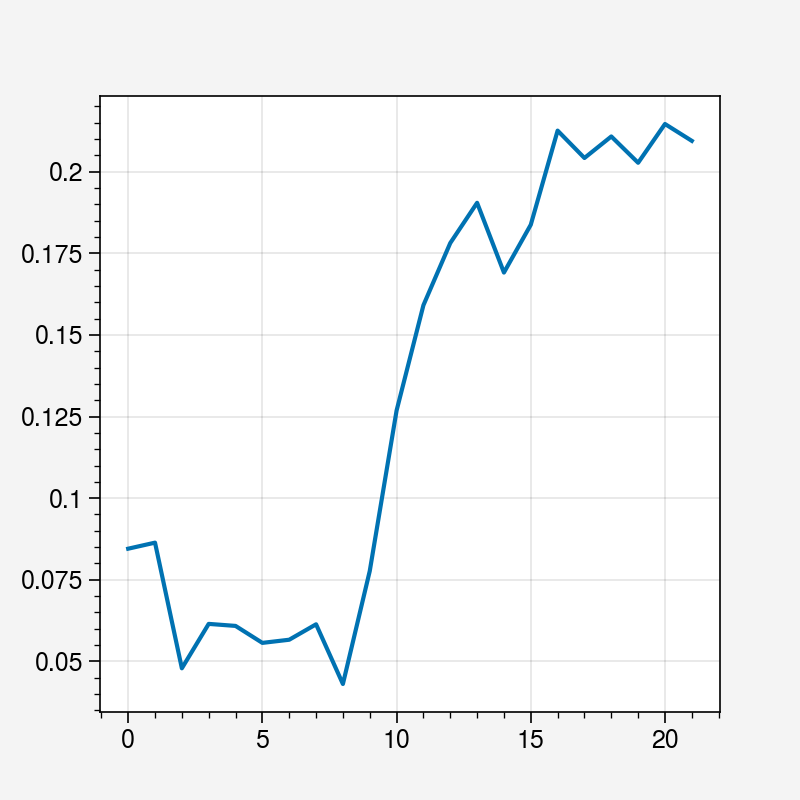

In [283]:
scores = []
for i in range(len(shortcut_res)):
    res = shortcut_res[i]
    activ = res['activs']['shared_activations'][1]
    labels, no_cluster = decompose_shortcut_trajectories(res)

    idxs1, idxs2 = labels == 1, labels == 2
    score = two_set_silhouette_score(activ[idxs1], activ[idxs2])
    scores.append(score)
plt.plot(scores)

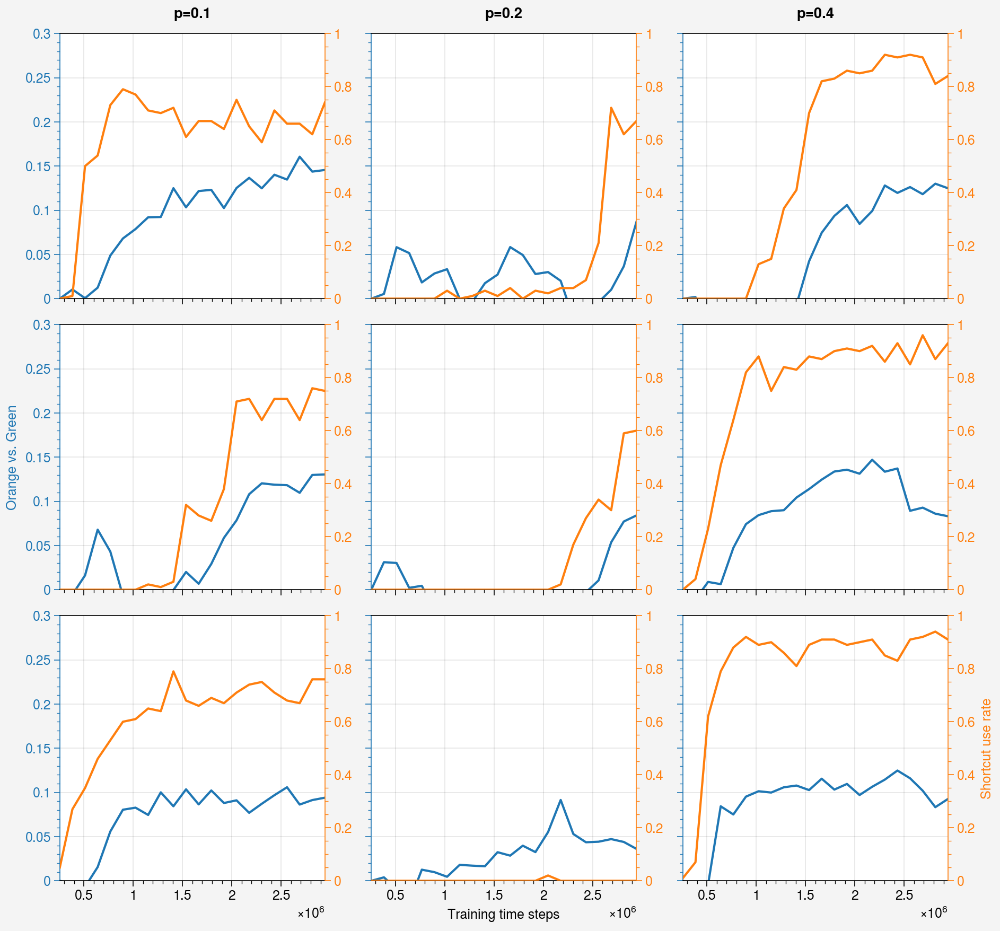

In [287]:
all_silscores = pickle.load(open('data/shortcut/wc4_copied/pairwise_silscores_noumap', 'rb'))
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc4_userates', 'rb'))
chks = 40 + np.arange(0, 440, 20)
probs = [0.1, 0.2, 0.4]
batch = 64

fig, ax = pplt.subplots(ncols=3, nrows=3)
dual = ax.dualy(lambda y: (y) / 0.3, color=hex_colors[1])

num_chks = len(chks)
for n, p in enumerate(probs):
    count = 0
    ys = []
    ys2 = []
    
    for t in range(3):
        key = f'{batch}_{p}_{t}'
        scores = []
        for chk in range(num_chks):
            scores.append(all_silscores[key][chk][1, 2] - all_silscores[key][0][1, 2])
            # scores.append(all_silscores[key][chk][1, 2])
            
        ax[t, n].plot(chks*64*100, scores, label='Mean silhouette score', 
                      color=rgb_colors[0])
        dual[t, n].plot(chks*64*100, all_shortcut_use_rates[key], 
                        label='Shortcut use rate', color=rgb_colors[1])
                
ax.format(toplabels=[f'p={p}' for p in probs], xlabel='Training time steps',
          ylim=[0, 0.3], ycolor=hex_colors[0], ylabel='Orange vs. Green')
dual[-1].format(ylabel='Shortcut use rate')


In [ ]:
all_silscores[key]

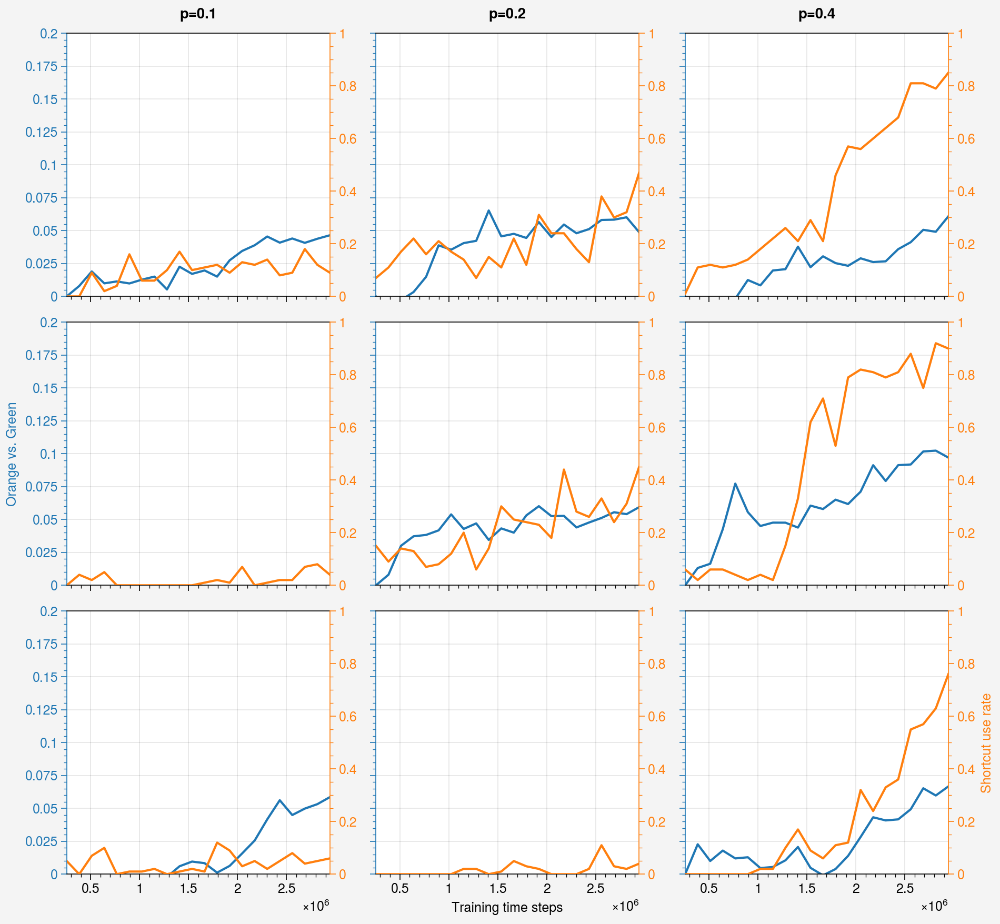

In [202]:
all_silscores = pickle.load(open('data/shortcut/wc1.5_copied/pairwise_silscores_noumap', 'rb'))
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates', 'rb'))
chks = 40 + np.arange(0, 440, 20)
probs = [0.1, 0.2, 0.4]

fig, ax = pplt.subplots(ncols=3, nrows=3)
dual = ax.dualy(lambda y: (y) / 0.2, color=hex_colors[1])

num_chks = len(chks)
for n, p in enumerate(probs):
    count = 0
    ys = []
    ys2 = []
    
    for t in range(3):
        key = f'{p}_{t}'
        scores = []
        for chk in range(num_chks):
            scores.append(all_silscores['shared1'][key][chk][1, 2] - all_silscores['shared1'][key][0][1, 2])
            # scores.append(all_silscores[key][chk][1, 2])
            
        ax[t, n].plot(chks*64*100, scores, label='Mean silhouette score', 
                      color=rgb_colors[0])
        dual[t, n].plot(chks*64*100, all_shortcut_use_rates[key], 
                        label='Shortcut use rate', color=rgb_colors[1])
                
ax.format(toplabels=[f'p={p}' for p in probs], xlabel='Training time steps',
          ylim=[0, 0.2], ycolor=hex_colors[0], ylabel='Orange vs. Green')
dual[-1].format(ylabel='Shortcut use rate')


## Looking at average activation strengths over training

There is definite changes in activation strengths and weight sizes in the network over the course of training which might need to be renormalized down to random sizes during transfer, but not so much observation of "tau-dormant" neuron effects

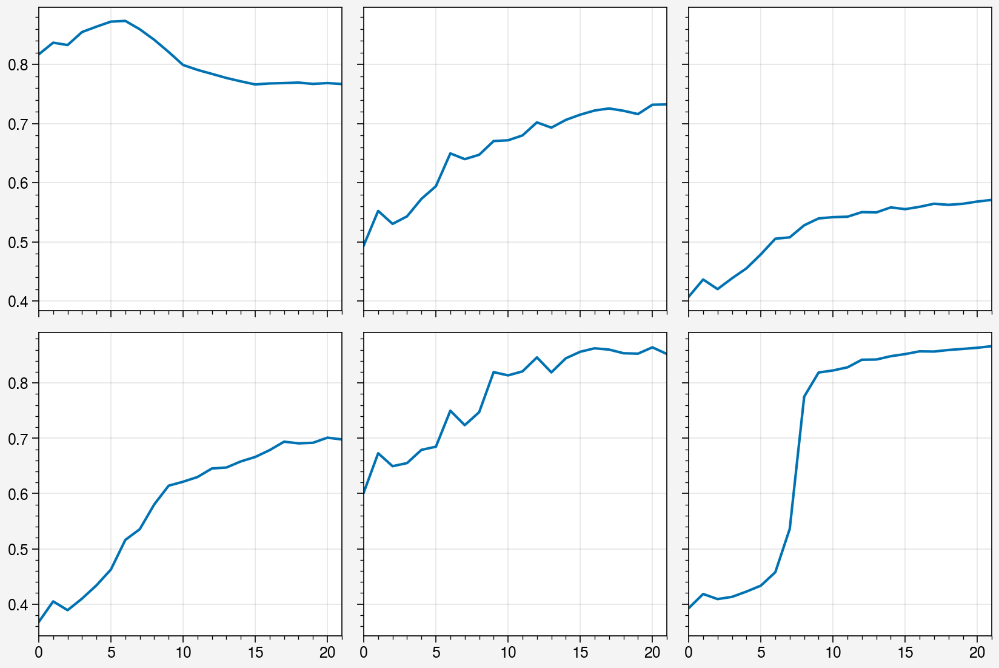

In [25]:
layers = ['shared', 'actor', 'critic']
fig, ax = pplt.subplots(nrows=2, ncols=3)


for i in range(2):
    for j, layer in enumerate(layers):
        ys = []
        for ep in range(len(shortcut_res)):
            res = shortcut_res[ep]
            ys.append(res['activs'][f'{layer}_activations'][i].abs().mean().item())
        ax[i, j].plot(ys)
    

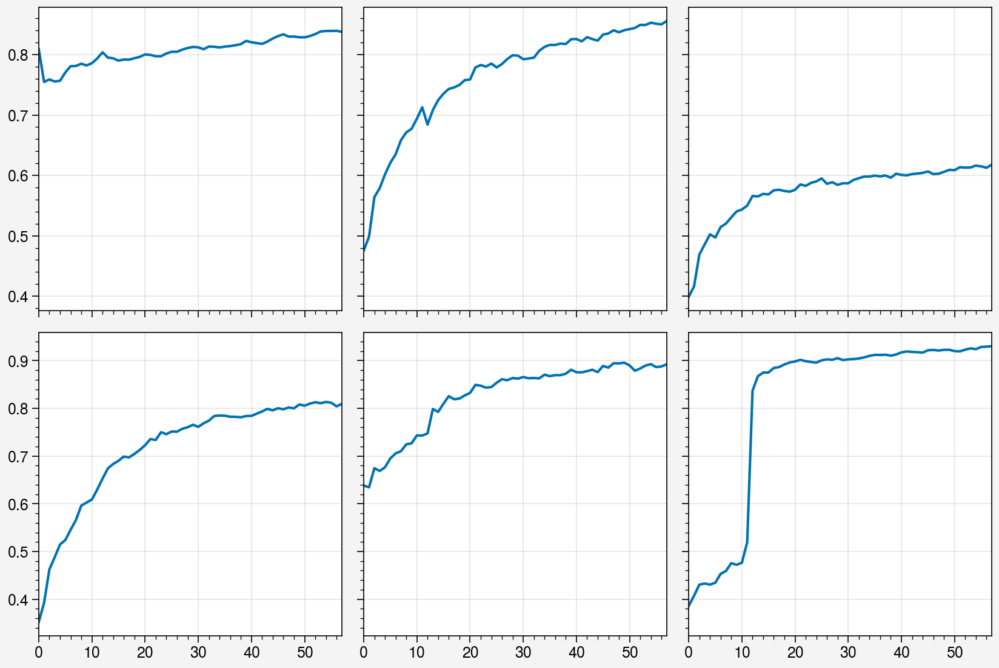

In [40]:
layers = ['shared', 'actor', 'critic']
fig, ax = pplt.subplots(nrows=2, ncols=3)


for i in range(2):
    for j, layer in enumerate(layers):
        ys = []
        for ep in range(len(shortcut_res)):
            res = shortcut_res[ep]
            ys.append(res['activs'][f'{layer}_activations'][i].abs().mean().item())
        ax[i, j].plot(ys)
    

In [59]:
mean_activs = res['activs']['shared_activations'][0].abs().mean(dim=0)

In [60]:
mean_activs / mean_activs.mean()

tensor([0.9817, 1.0331, 0.9577, 0.9296, 1.0845, 1.0569, 1.0306, 1.0269, 0.9232,
        0.9939, 0.9929, 0.9609, 1.0470, 0.9805, 1.0233, 1.0208, 0.9908, 1.0575,
        0.9967, 1.0053, 1.0247, 0.9812, 0.9531, 1.0168, 1.0943, 0.9767, 1.0567,
        0.9877, 1.0624, 0.8988, 0.9125, 1.0145, 0.9944, 0.9727, 0.9406, 1.0222,
        1.0393, 1.0639, 1.0415, 1.0259, 1.1057, 1.0168, 0.9726, 1.0649, 1.0579,
        1.0333, 0.9218, 1.0337, 0.9615, 1.0283, 0.9664, 0.9082, 0.9329, 1.0313,
        1.1412, 0.9767, 0.9356, 0.9623, 1.0190, 0.9835, 0.9239, 0.9593, 0.9576,
        0.9319])

In [45]:
res['activs']['shared_activations'][1].mean(dim=0)

tensor([-0.8531, -0.4425, -0.6285, -0.4303,  0.6976, -0.5010,  0.5696,  0.1111,
         0.9129, -0.4553,  0.3036,  0.2821,  0.8281,  0.3883,  0.2220,  0.5957,
        -0.2243,  0.2192, -0.1213, -0.8724, -0.4975, -0.7244, -0.8790,  0.3217,
        -0.4797, -0.2851, -0.4046,  0.6197,  0.0280, -0.3379, -0.4258, -0.5092,
         0.3485,  0.3591, -0.3722, -0.8217,  0.4454, -0.3398, -0.9269, -0.0490,
         0.1856, -0.7442, -0.5975,  0.7327, -0.5506, -0.7036, -0.2751, -0.1234,
         0.1449, -0.2006, -0.3532, -0.7255,  0.3902,  0.2058, -0.7393,  0.3880,
        -0.7015, -0.4625, -0.1311, -0.2668,  0.1198,  0.0650,  0.9461,  0.1822])

In [75]:
chks = np.arange(0, 470, 20)

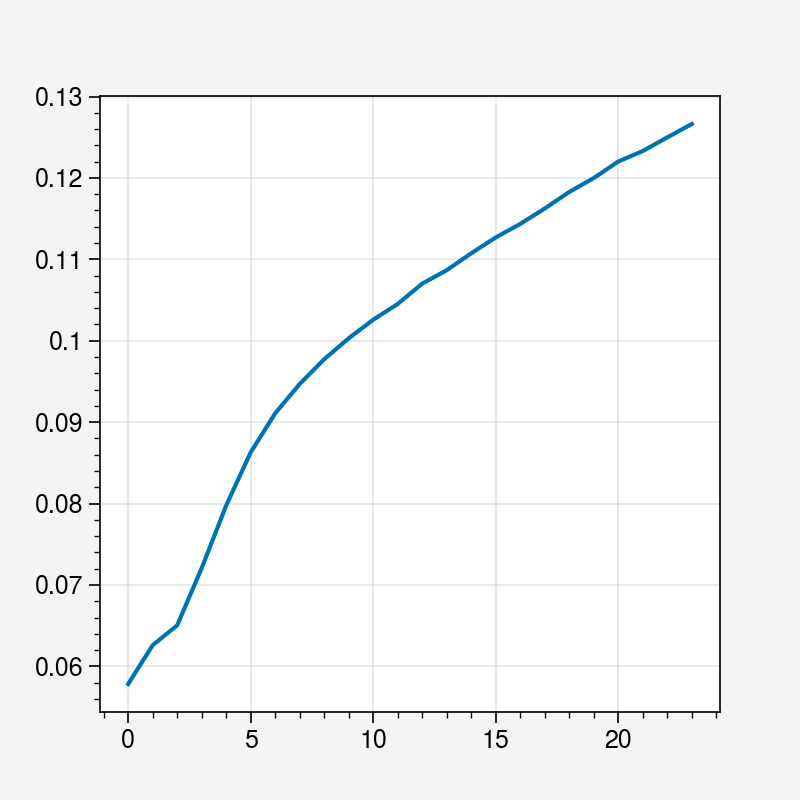

In [78]:
ys = []
for chk in chks:
    model, obs_rms = load_chk(f'shortcut_wc1.5p0.4', chk, trial=0, subdir='shortcut_wc')
    params = list(model.base.gru.parameters())
    ys.append(params[0].abs().mean().item())
    
plt.plot(ys)

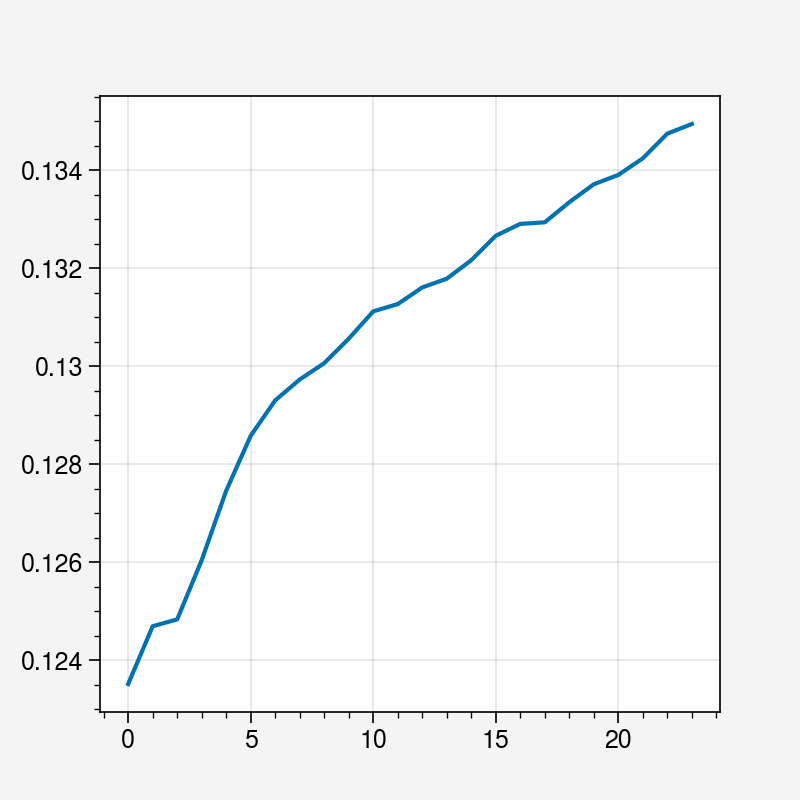

In [81]:
ys = []
for chk in chks:
    model, obs_rms = load_chk(f'shortcut_wc1.5p0.4', chk, trial=0, subdir='shortcut_wc')
    # params = list(model.base.gru.parameters())
    params = list(model.base.shared0.parameters())
    ys.append(params[0].abs().mean().item())
    
plt.plot(ys)

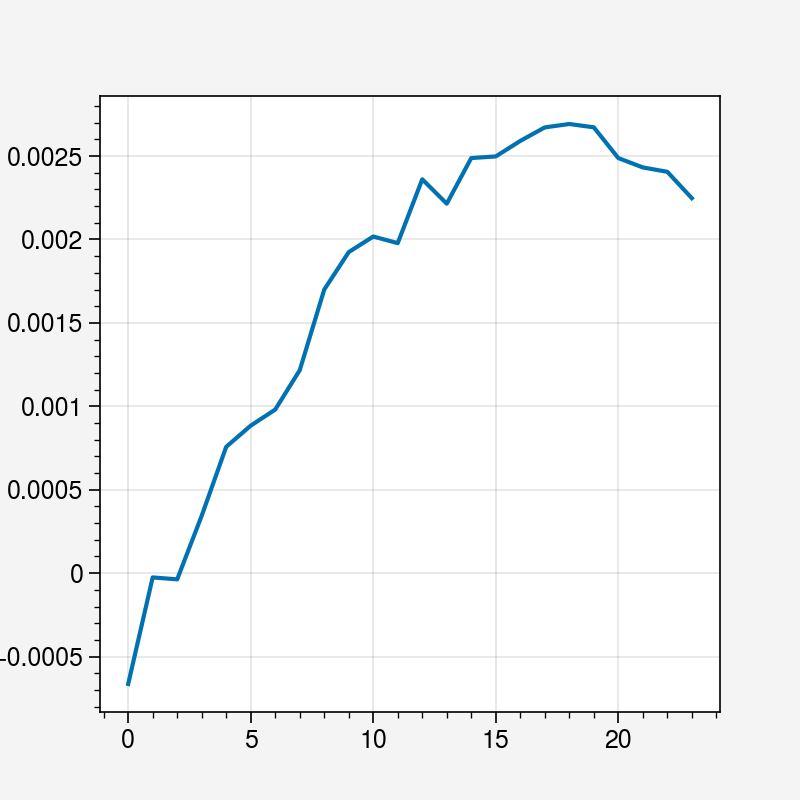

In [79]:
ys = []
for chk in chks:
    model, obs_rms = load_chk(f'shortcut_wc1.5p0.4', chk, trial=0, subdir='shortcut_wc')
    params = list(model.base.gru.parameters())
    ys.append(params[0].mean().item())
    
plt.plot(ys)

# Silscores on different layers

**4 wall colors**

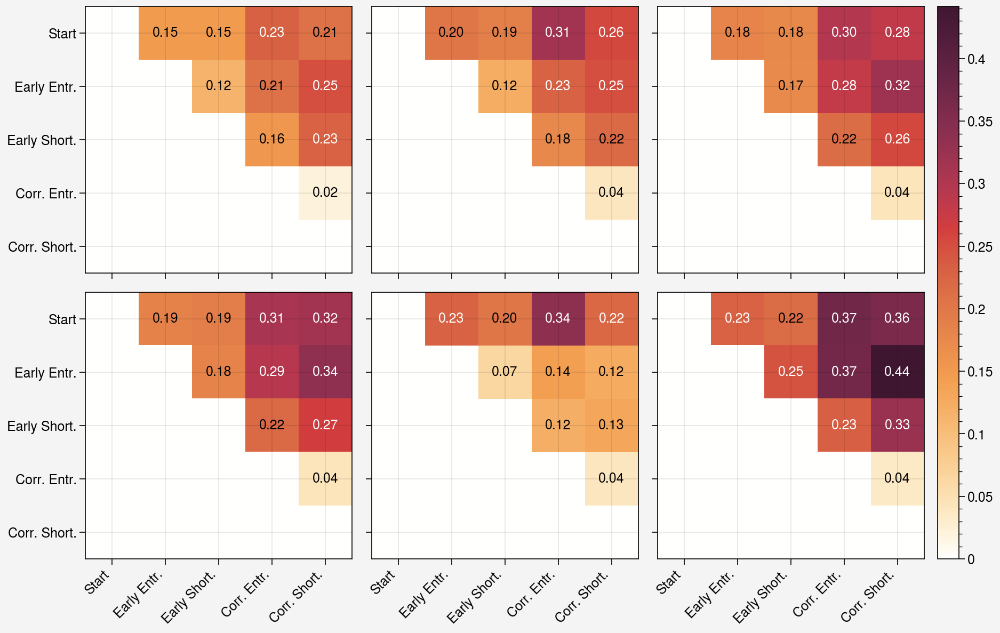

In [57]:
all_silscores = pickle.load(open('data/shortcut/wc4_copied/pairwise_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros((5, 5))
    for key in all_silscores[layer]:
        silscores += all_silscores[layer][key][-1]
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    
    y = i // 2
    x = i % 2
    cbar = pairwise_silscore_plot(plot_silscores[i]/count, vmax=max_score,
                          ax=ax[x, y], draw_cbar=False)
fig.colorbar(cbar)

**White wall color**

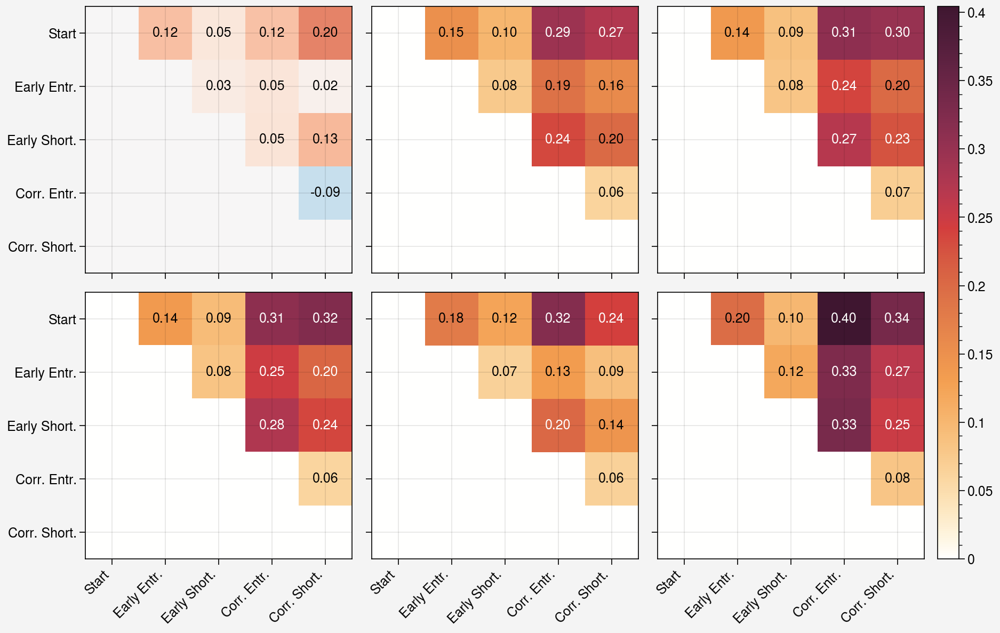

In [58]:
all_silscores = pickle.load(open('data/shortcut/wc1.5_copied/pairwise_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros((5, 5))
    for key in all_silscores[layer]:
        silscores += all_silscores[layer][key][-1]
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    
    y = i // 2
    x = i % 2
    cbar = pairwise_silscore_plot(plot_silscores[i]/count, vmax=max_score,
                          ax=ax[x, y], draw_cbar=False)
fig.colorbar(cbar)

## Change over training

**4 wall colors**

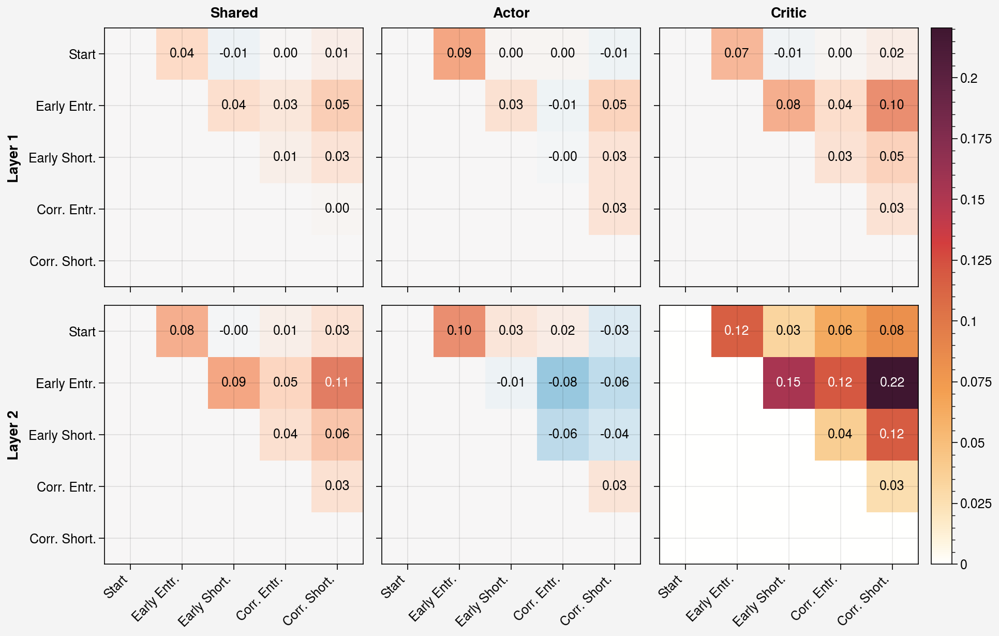

In [203]:
all_silscores = pickle.load(open('data/shortcut/wc4_copied/pairwise_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros((5, 5))
    for key in all_silscores[layer]:
        silscores += (all_silscores[layer][key][-1] - all_silscores[layer][key][0])
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    y = i // 2
    x = i % 2
    cbar = pairwise_silscore_plot(plot_silscores[i]/count, vmax=max_score,
                          ax=ax[x, y], draw_cbar=False)
fig.colorbar(cbar)
ax.format(toplabels=['Shared', 'Actor', 'Critic'], leftlabels=['Layer 1', 'Layer 2'])

**White wall color**

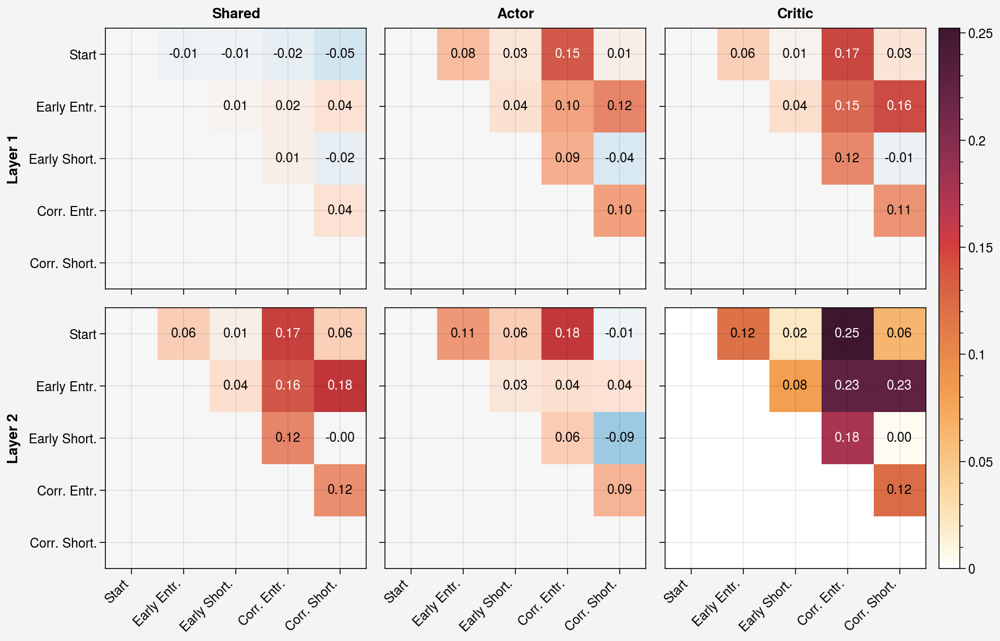

In [204]:
all_silscores = pickle.load(open('data/shortcut/wc1.5_copied/pairwise_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros((5, 5))
    for key in all_silscores[layer]:
        silscores += (all_silscores[layer][key][-1] - all_silscores[layer][key][0])
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    y = i // 2
    x = i % 2
    cbar = pairwise_silscore_plot(plot_silscores[i]/count, vmax=max_score,
                          ax=ax[x, y], draw_cbar=False)
fig.colorbar(cbar)
ax.format(toplabels=['Shared', 'Actor', 'Critic'], leftlabels=['Layer 1', 'Layer 2'])

### One vs all silscores instead of pairwise

**4 Wall colors**

In [67]:
all_silscores = defaultdict(dict)

probs = [0.1, 0.2, 0.4]
batch_sizes = [32, 64]
trials = range(3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

for p, batch, t in tqdm(itertools.product(probs, batch_sizes, trials), total=18):
    key = f'{batch}_{p}_{t}'

    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))

    for layer in layers:
        silscores = []
        l_type = layer[:-1] + '_activations'
        l_num = int(layer[-1])
        
        for i, res in enumerate(shortcut_res):
            if i == 0 or i == len(shortcut_res) - 1:
                activ = res['activs'][l_type][l_num]
                labels, no_cluster = decompose_shortcut_trajectories(res)
                silscore = one_vs_all_silhouette_score(activ, labels)
                silscores.append(silscore)

        all_silscores[layer][key] = silscores
            
    pickle.dump(all_silscores, open('data/shortcut/wc4_copied/onevsall_silscores_noumap', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 18/18 [08:36<00:00, 28.71s/it]


**White wall color**

In [ ]:
all_silscores = defaultdict(dict)

probs = [0.1, 0.2, 0.4]
trials = range(3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

for p, t in tqdm(itertools.product(probs, trials), total=9):
    key = f'{p}_{t}'

    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))

    for layer in layers:
        silscores = []
        l_type = layer[:-1] + '_activations'
        l_num = int(layer[-1])
        
        for i, res in enumerate(shortcut_res):
            if i == 0 or i == len(shortcut_res) - 1:
                activ = res['activs'][l_type][l_num]
                labels, no_cluster = decompose_shortcut_trajectories(res)
                silscore = one_vs_all_silhouette_score(activ, labels)
                silscores.append(silscore)

        all_silscores[layer][key] = silscores
            
    pickle.dump(all_silscores, open('data/shortcut/wc1.5_copied/onevsall_silscores_noumap', 'wb'))

  6%|████▎                                                                        | 1/18 [00:28<08:09, 28.78s/it]

# Silscores on different layers

**4 wall colors**

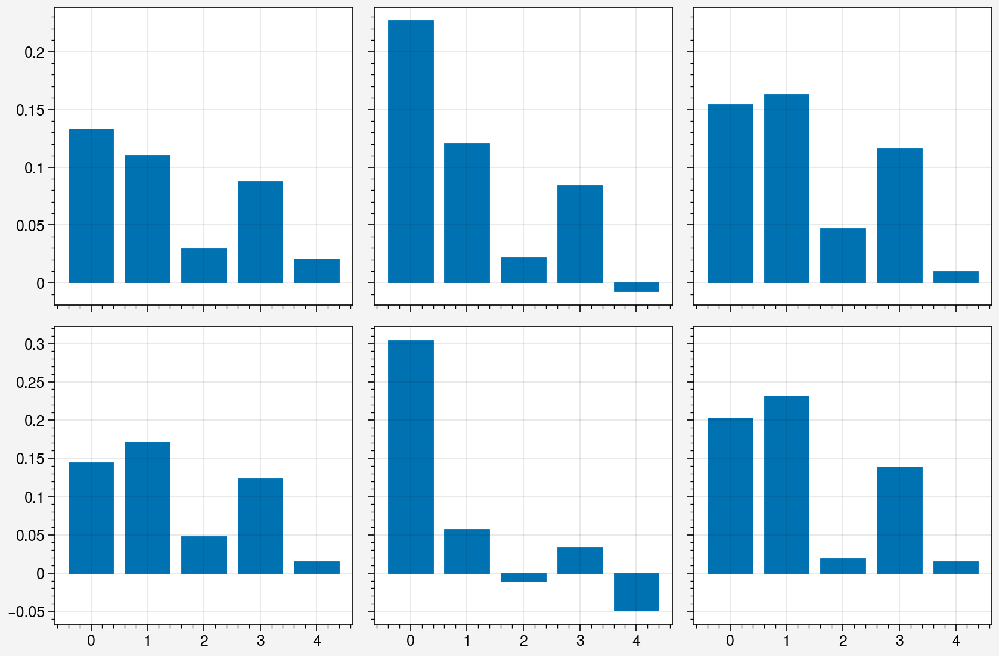

In [77]:
all_silscores = pickle.load(open('data/shortcut/wc4_copied/onevsall_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros(5)
    for key in all_silscores[layer]:
        silscores += all_silscores[layer][key][-1]
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    
    y = i // 2
    x = i % 2
    ax[x, y].bar(plot_silscores[i]/count)

# fig.colorbar(cbar)


**White wall color**

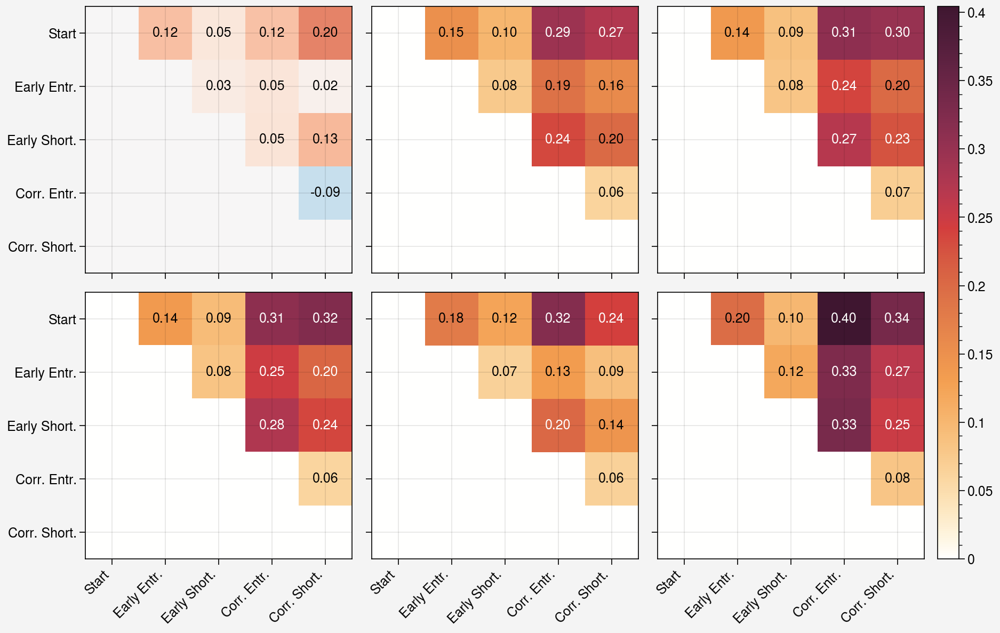

In [58]:
all_silscores = pickle.load(open('data/shortcut/wc1.5_copied/pairwise_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros((5, 5))
    for key in all_silscores[layer]:
        silscores += all_silscores[layer][key][-1]
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    
    y = i // 2
    x = i % 2
    cbar = pairwise_silscore_plot(plot_silscores[i]/count, vmax=max_score,
                          ax=ax[x, y], draw_cbar=False)
fig.colorbar(cbar)

## Change over training

**4 wall colors**

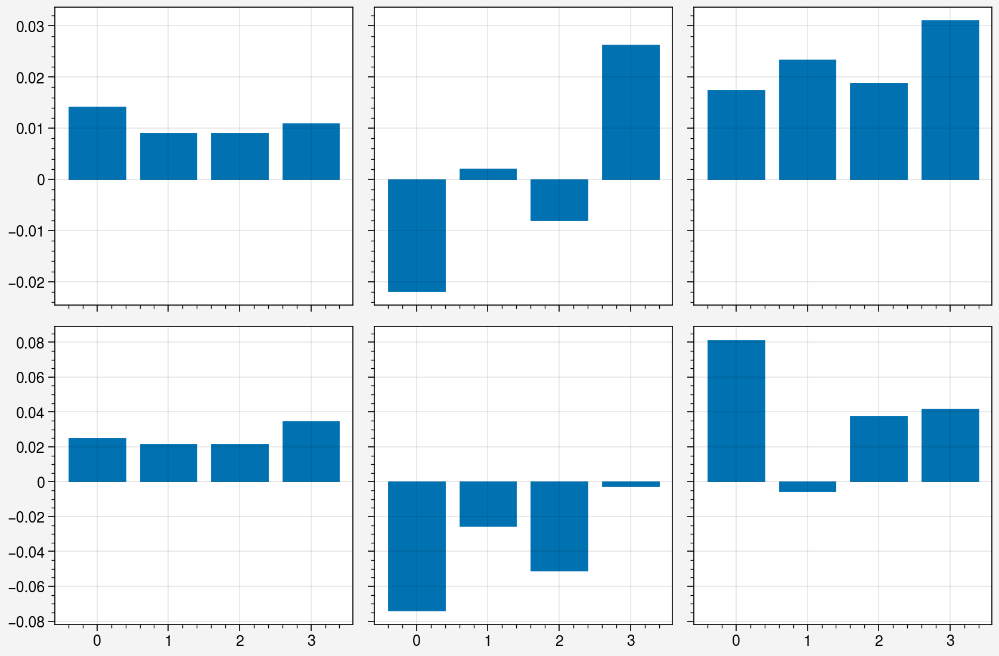

In [79]:
all_silscores = pickle.load(open('data/shortcut/wc4_copied/onevsall_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros(5)
    for key in all_silscores[layer]:
        silscores += (all_silscores[layer][key][-1] - all_silscores[layer][key][0])
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    
    y = i // 2
    x = i % 2
    ax[x, y].bar(plot_silscores[i][1:]/count)

# fig.colorbar(cbar)


**White wall color**

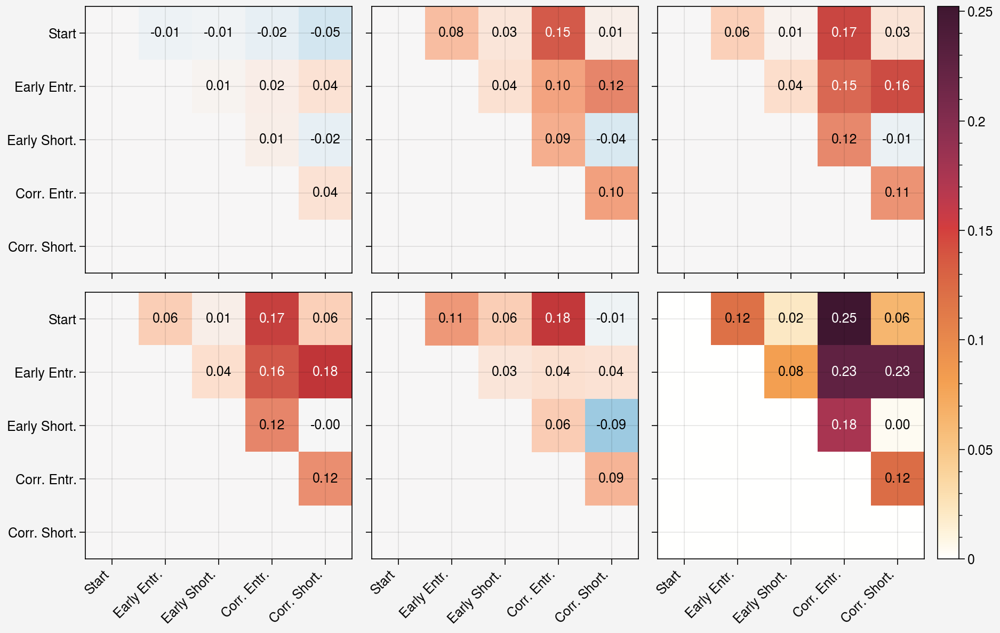

In [60]:
all_silscores = pickle.load(open('data/shortcut/wc1.5_copied/pairwise_silscores_noumap', 'rb'))

fig, ax = pplt.subplots(nrows=2, ncols=3)
layers = ['shared0', 'shared1', 'actor0', 'actor1', 'critic0', 'critic1']

plot_silscores = []
for i, layer in enumerate(layers):
    silscores = np.zeros((5, 5))
    for key in all_silscores[layer]:
        silscores += (all_silscores[layer][key][-1] - all_silscores[layer][key][0])
    plot_silscores.append(silscores)

count = len(all_silscores[layer])
max_score = np.max(np.vstack(plot_silscores)) / count

for i, layer in enumerate(layers):
    y = i // 2
    x = i % 2
    cbar = pairwise_silscore_plot(plot_silscores[i]/count, vmax=max_score,
                          ax=ax[x, y], draw_cbar=False)
fig.colorbar(cbar)

In [80]:
from sklearn.decomposition import PCA

In [81]:
p = 0.4
t = 2
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))


res = shortcut_res[15]

activ = res['activs']['shared_activations'][1]

pca = PCA()
activ = pca.fit_transform(activ)
labels, no_cluster = decompose_shortcut_trajectories(res)

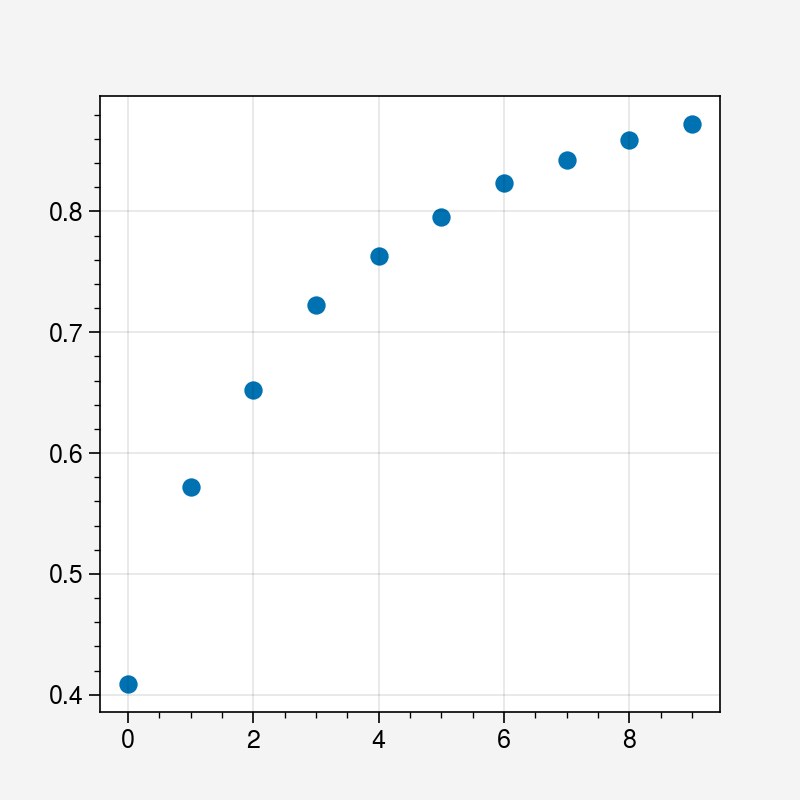

In [92]:
plt.scatter(range(10), pca.explained_variance_ratio_[:10].cumsum())

In [ ]:
pca.explained_variance_ratio_

In [103]:
%matplotlib inline

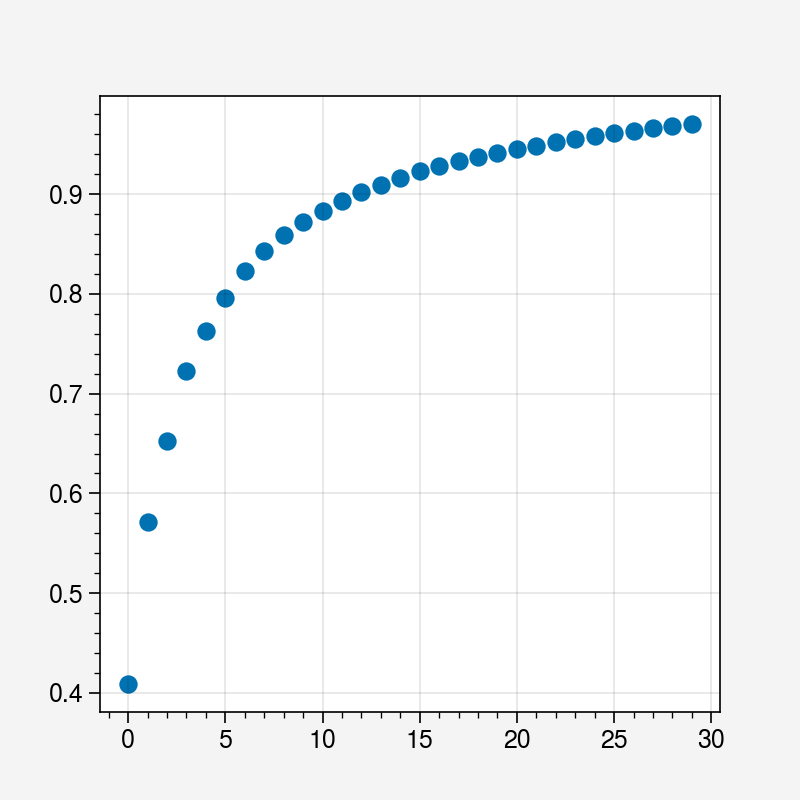

In [104]:
plt.scatter(range(30), pca.explained_variance_ratio_[:30].cumsum())

In [105]:
%matplotlib tk

In [107]:
fig, ax = pplt.subplots(proj='3d', figwidth=10)
ax.scatter(activ[:, 0], activ[:, 1], activ[:, 2])

In [100]:
fig, ax = pplt.subplots(proj='3d', figwidth=10)
for i in range(5):
    idxs = labels == i
    ax.scatter(activ[idxs, 0], activ[idxs, 1], activ[idxs, 2])

In [101]:
fig, ax = pplt.subplots(proj='3d', figwidth=10)
for i in range(5):
    idxs = labels == i
    ax.scatter(activ[idxs, 3], activ[idxs, 4], activ[idxs, 5])

In [93]:
activ.shape

(4565, 64)

In [108]:
%matplotlib inline

In [109]:
activ.shape

(4565, 64)

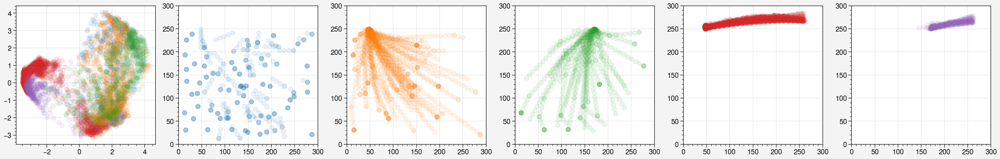

In [111]:
p = 0.4
t = 2
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))

res = shortcut_res[15]
activ = res['activs']['critic_activations'][0]
pos = res['pos']
labels, no_cluster = decompose_shortcut_trajectories(res)

pca = PCA()
activ = pca.fit_transform(activ)

kmeans_activ_pos_plot(pos, activ[:, :2], labels=labels)

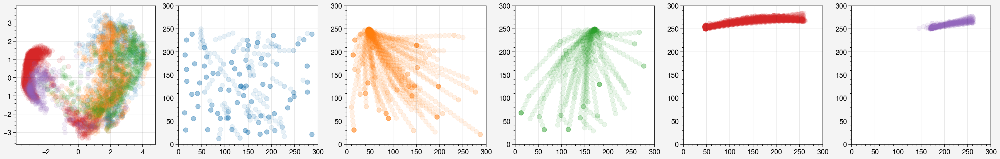

In [112]:
p = 0.4
t = 2
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))

res = shortcut_res[-1]
activ = res['activs']['critic_activations'][0]
pos = res['pos']
labels, no_cluster = decompose_shortcut_trajectories(res)

pca = PCA()
activ = pca.fit_transform(activ)

kmeans_activ_pos_plot(pos, activ[:, :2], labels=labels)

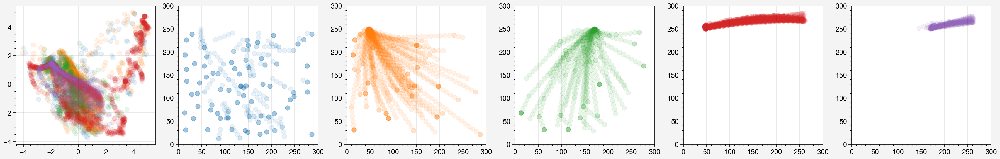

In [114]:
p = 0.4
t = 0
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))

res = shortcut_res[-1]
activ = res['activs']['shared_activations'][0]
pos = res['pos']
labels, no_cluster = decompose_shortcut_trajectories(res)

pca = PCA()
activ = pca.fit_transform(activ)

kmeans_activ_pos_plot(pos, activ[:, :2], labels=labels)

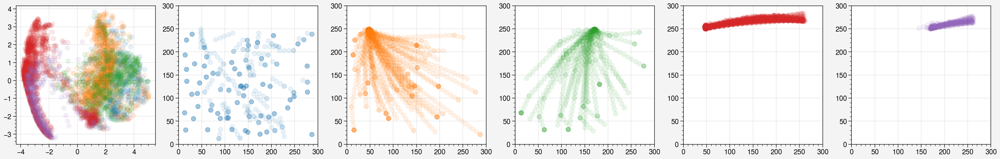

In [133]:
p = 0.4
t = 0
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))

res = shortcut_res[-1]
activ = res['activs']['shared_activations'][1]
pos = res['pos']
labels, no_cluster = decompose_shortcut_trajectories(res)

pca = PCA()
activ2 = pca.fit_transform(activ)

kmeans_activ_pos_plot(pos, activ2[:, :2], labels=labels)

In [125]:
ep_lens = get_ep_lens(res['ep_pos'])
ep_sa = ep_split_res(res['shortcut_avail'], ep_lens)
ep_su = ep_split_res(res['shortcut_used'], ep_lens)

np.sum([u[0] for u in ep_su])/np.sum([a[0] for a in ep_sa])

0.6727272727272727

In [130]:
score = pairwise_silhouette_score(activ, labels)
score2 = pairwise_silhouette_score(activ2, labels)

In [131]:
score

array([[0.        , 0.15713602, 0.10088917, 0.35534203, 0.34562233],
       [0.        , 0.        , 0.113439  , 0.27041113, 0.24823472],
       [0.        , 0.        , 0.        , 0.30148682, 0.25240615],
       [0.        , 0.        , 0.        , 0.        , 0.01531221],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

In [132]:
score2

array([[0.        , 0.15713602, 0.10088917, 0.35534203, 0.34562233],
       [0.        , 0.        , 0.113439  , 0.27041114, 0.24823472],
       [0.        , 0.        , 0.        , 0.30148679, 0.25240617],
       [0.        , 0.        , 0.        , 0.        , 0.01531221],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

In [ ]:
activ2 = 

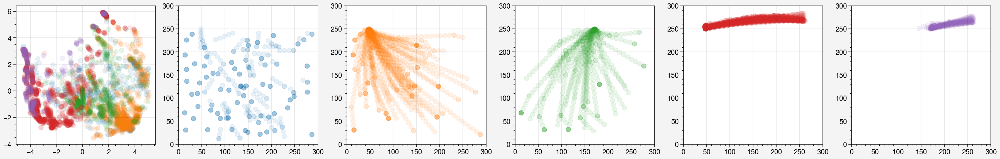

In [134]:
p = 0.4
t = 0
key = f'{64}_{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))

res = shortcut_res[-1]
activ = res['activs']['shared_activations'][0]
pos = res['pos']
labels, no_cluster = decompose_shortcut_trajectories(res)

pca = PCA()
activ = pca.fit_transform(activ)

kmeans_activ_pos_plot(pos, activ[:, :2], labels=labels)

In [138]:
t = 2

key = f'{64}_{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))

res = shortcut_res[5]
res['shortcut_use_rate']

0.85

In [152]:
model, obs_rms = load_chk('shortcutnav_fcp0.4reset3batch64', chk=400, trial=2)

sur = test_shortcut_use_rate(model, obs_rms)

sur

0.9

In [153]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))

In [154]:
fa['seed']

1

In [172]:
res = test_shortcut_activations(model, obs_rms, seed=1)

In [174]:
ep_lens = get_ep_lens(res['ep_pos'])
ep_sa = ep_split_res(res['shortcut_avail'], ep_lens)
ep_su = ep_split_res(res['shortcut_used'], ep_lens)

np.sum([u[0] for u in ep_su])/np.sum([a[0] for a in ep_sa])

0.8909090909090909

In [176]:
np.sum([a[0] for a in ep_sa])

55

In [184]:
fa = pickle.load(open('data/shortcut/forced_actions2', 'rb'))
model, obs_rms = load_chk('shortcut_wc1.5p0.4', subdir='shortcut_wc', chk=460, trial=0)

res = test_shortcut_activations(model, obs_rms, seed=fa['seed'], forced_actions=fa['forced_actions'],
                                env_kwargs={'wall_colors': 1.5}, skip_activs=False, test_only=True)

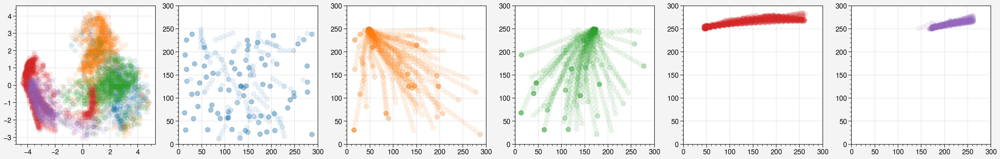

In [185]:
activ = res['activs']['shared_activations'][1]
pos = res['pos']
labels, no_cluster = decompose_shortcut_trajectories(res)

pca = PCA()
activ2 = pca.fit_transform(activ)

kmeans_activ_pos_plot(pos, activ2[:, :2], labels=labels)

In [189]:
res.keys()

dict_keys(['ep_pos', 'pos', 'angle', 'actions', 'shortcut_avail', 'shortcut_used', 'ep_shortcut_used', 'ep_shortcut_avail', 'activs'])

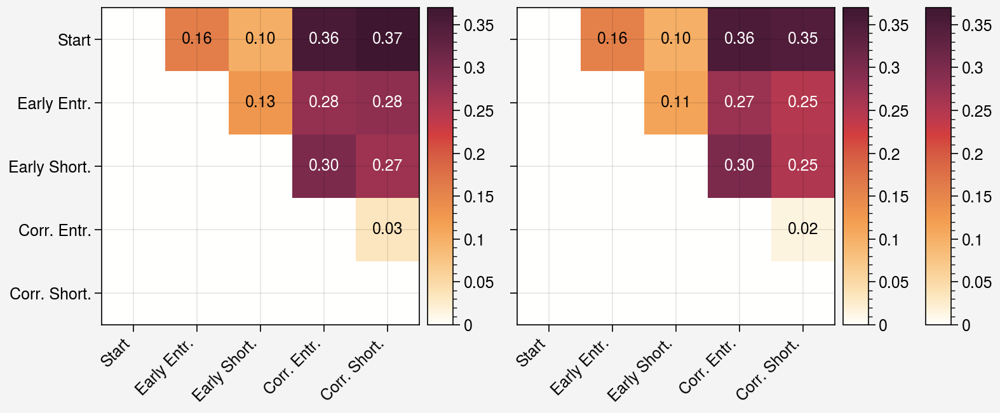

In [190]:
labels, no_cluster = decompose_shortcut_trajectories(res)
silscore = pairwise_silhouette_score(res['activs']['shared_activations'][1], labels)

p = 0.4
t = 0
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))
res2 = shortcut_res[-1]

labels, no_cluster = decompose_shortcut_trajectories(res2)
silscore2 = pairwise_silhouette_score(res2['activs']['shared_activations'][1], labels)

fig, ax = pplt.subplots(ncols=2)
max_score = np.max([silscore, silscore2])
pairwise_silscore_plot(silscore, ax=ax[0], vmax=max_score, draw_cbar=False)
cbar = pairwise_silscore_plot(silscore2, ax=ax[1], vmax=max_score, draw_cbar=False)
fig.colorbar(cbar)

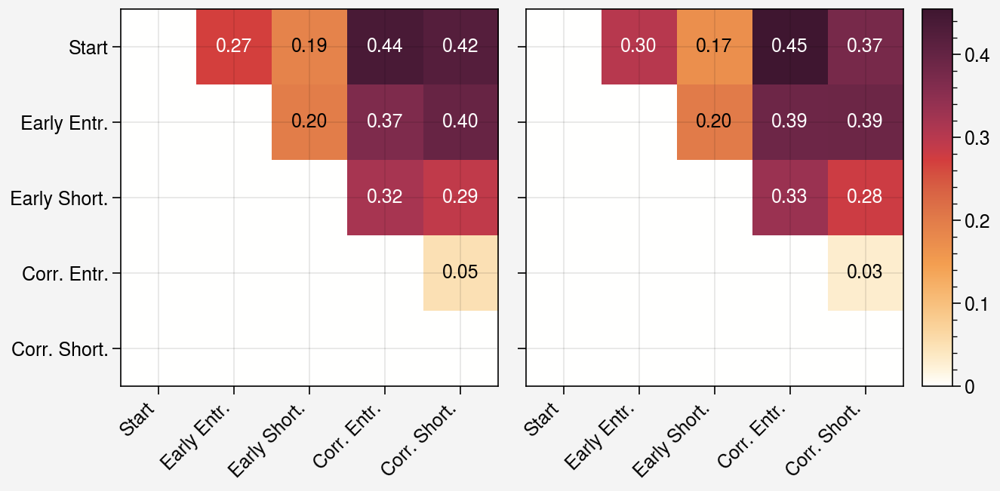

In [192]:
labels, no_cluster = decompose_shortcut_trajectories(res)
silscore = pairwise_silhouette_score(res['activs']['critic_activations'][1], labels)

p = 0.4
t = 0
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))
res2 = shortcut_res[-1]

labels, no_cluster = decompose_shortcut_trajectories(res2)
silscore2 = pairwise_silhouette_score(res2['activs']['critic_activations'][1], labels)

fig, ax = pplt.subplots(ncols=2)
max_score = np.max([silscore, silscore2])
pairwise_silscore_plot(silscore, ax=ax[0], vmax=max_score, draw_cbar=False)
cbar = pairwise_silscore_plot(silscore2, ax=ax[1], vmax=max_score, draw_cbar=False)
fig.colorbar(cbar)

In [179]:
%run shortcut_analysis
pplt.rc.reset()

In [217]:
env = make_vec_envs('ShortcutNav-v0', seed=1, normalize=False, 
                    env_kwargs={'wall_colors': 4, 'character_reset_pos': 3})

poss = []
for i in range(100):
    env.reset()
    poss.append(env.envs[0].character.pos.copy())
    

In [222]:
env = make_vec_envs('ShortcutNav-v0', seed=1, normalize=False, 
                    env_kwargs={'wall_colors': 1.5, 'character_reset_pos': 3,
                               'shortcut_probability': 1})

poss2 = []
for i in range(100):
    env.reset()
    poss2.append(env.envs[0].character.pos.copy())
    

In [263]:
env = make_vec_envs('ShortcutNav-v0', seed=1, normalize=False, 
                    env_kwargs={'wall_colors': 1.5, 'character_reset_pos': 3,
                               'shortcut_probability': 1})

sa = []
for i in range(100):
    env.reset()
    sa.append(env.envs[0].shortcuts_available[0])
    

In [4]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']
savedir = 'data/shortcut/wc4_copied'


model, obs_rms = load_chk('shortcutnav_fcp0.4reset3batch64', trial=0, chk=400)

res = test_shortcut_activations(model, obs_rms, shortcut_probability=1.,
                         skip_activs=False, test_only=True, forced_actions=forced_actions,
                         seed=seed)

In [6]:
shortcut_res = pickle.load(open('data/shortcut/wc4_copied/64_0.4_0', 'rb'))

res2 = shortcut_res[-4]

labels, no_cluster = decompose_shortcut_trajectories(res)


In [7]:
activs = res['activs']['shared_activations'][0]
activs2 = res2['activs']['shared_activations'][0]

silscore = pairwise_silhouette_score(activs,  labels)
silscore2 = pairwise_silhouette_score(activs2,  labels)

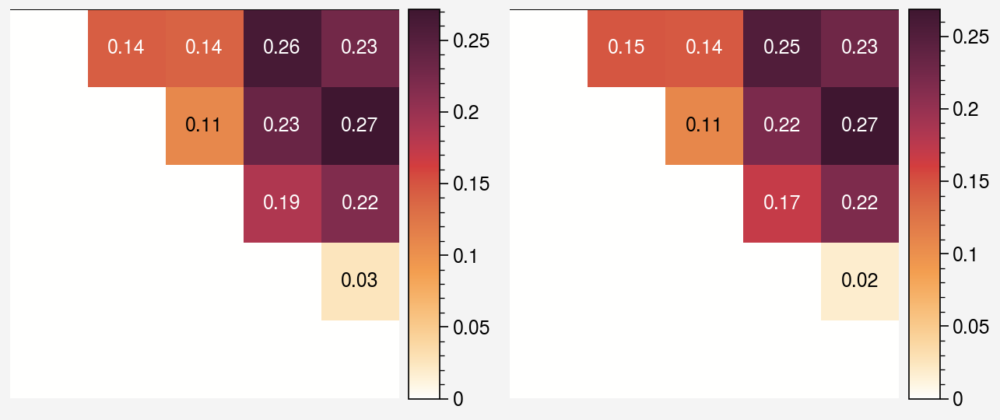

In [8]:
fig, ax = pplt.subplots(ncols=2)
pairwise_silscore_plot(silscore, ax=ax[0])
pairwise_silscore_plot(silscore2, ax=ax[1])

In [9]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']

# model, obs_rms = load_chk('shortcutnav_fcp0.4reset3batch64', trial=0, chk=400)
model, obs_rms = load_chk('shortcut_wc1.5p0.4', subdir='shortcut_wc', trial=0, chk=400)

res = test_shortcut_activations(model, obs_rms, shortcut_probability=1.,
                         skip_activs=False, test_only=True, forced_actions=forced_actions,
                         seed=seed, env_kwargs={'wall_colors': 1.5})

In [10]:
shortcut_res = pickle.load(open('data/shortcut/wc1.5_copied/0.4_0', 'rb'))

res2 = shortcut_res[-4]

labels, no_cluster = decompose_shortcut_trajectories(res)


In [11]:
activs = res['activs']['shared_activations'][0]
activs2 = res2['activs']['shared_activations'][0]

silscore = pairwise_silhouette_score(activs,  labels)
silscore2 = pairwise_silhouette_score(activs2,  labels)

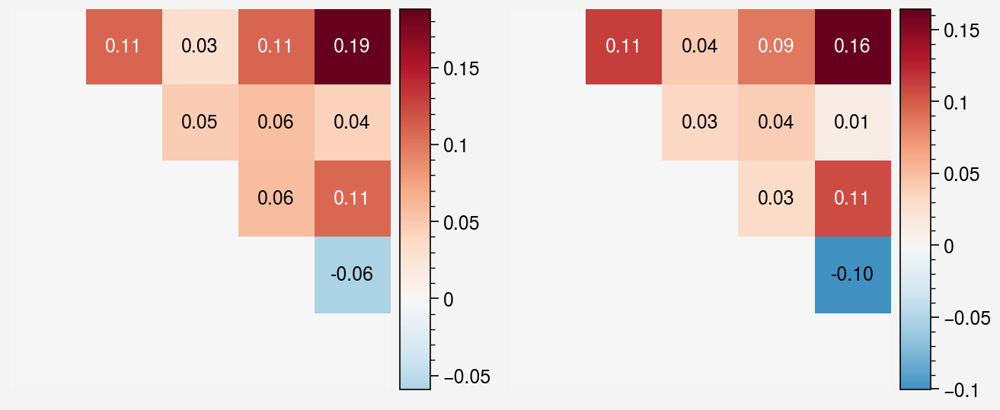

In [12]:
fig, ax = pplt.subplots(ncols=2)
pairwise_silscore_plot(silscore, ax=ax[0])
pairwise_silscore_plot(silscore2, ax=ax[1])

# Cloned layer shortcut usage

In [30]:
surs = defaultdict(list)
clone_sets = ['closhared', 'clofrshared',  'clocritic', 'clofrcritic']
for clone in clone_sets:
    for trial in range(3):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc1.5p0.1batch256', chk=190,
                 subdir='shortcut_clonewc', trial=trial)
        sur = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
        surs[clone].append(sur)
        
print(surs)


defaultdict(<class 'list'>, {'closhared': [0.1, 0.14, 0.18], 'clofrshared': [0.04, 0.37, 0.1], 'clocritic': [0.13, 0.13, 0.03], 'clofrcritic': [0.1, 0.09, 0.11]})


In [31]:
surs2 = defaultdict(list)
clone_sets = ['closhared', 'clofrshared',  'clocritic', 'clofrcritic']
for clone in clone_sets:
    for trial in range(3):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc4p0.1batch256', chk=190,
                 subdir='shortcut_clonewc', trial=trial)
        sur = test_shortcut_use_rate(model, obs_rms)
        surs2[clone].append(sur)
        
print(surs2)


defaultdict(<class 'list'>, {'closhared': [0.79, 0.68, 0.8], 'clofrshared': [0.72, 0.0, 0.76], 'clocritic': [0.68, 0.71, 0.66], 'clofrcritic': [0.77, 0.75, 0.0]})


In [34]:
for trial in range(3):
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/64_0.1_{trial}', 'rb'))
    res = shortcut_res[-1]
    print(res['shortcut_use_rate'])
    

0.8
0.8
0.8


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:36<00:00, 15.68s/it]


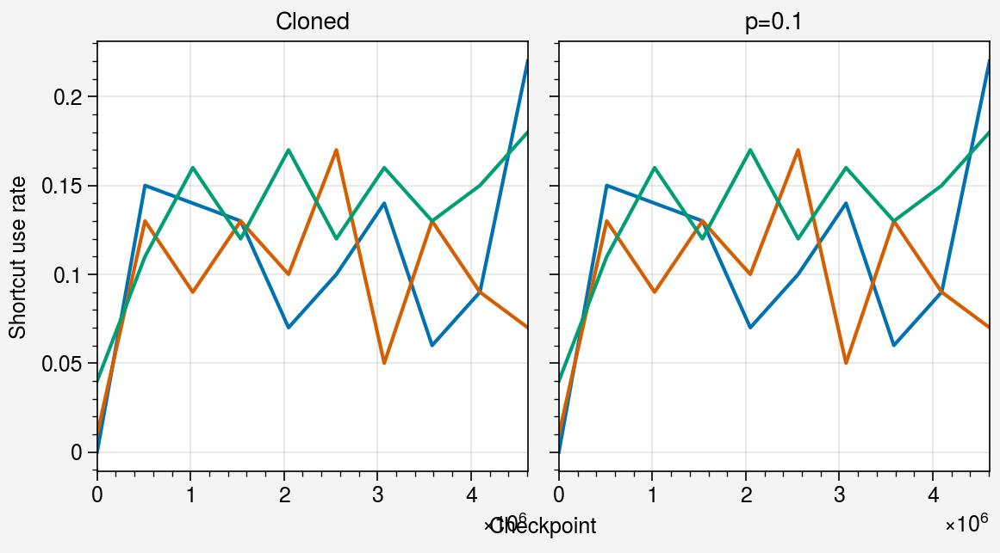

In [5]:
chks = np.arange(0, 190, 20)
clone = 'cloactor0'

clone_surs = []
for trial in range(3):
    sur = []
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc1.5p0.1batch256', chk=chk,
                 subdir='shortcut_clonewc', trial=trial)
        score = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
        sur.append(score)
    clone_surs.append(sur)

surs = []
for trial in range(3):
    sur = []
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm_wc1.5p0.1batch256', chk=chk,
                 subdir='shortcut_wc', trial=trial)
        score = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
        sur.append(score)
    surs.append(sur)

    
fig, ax = pplt.subplots(ncols=2)
xs = chks * 256 * 100
for i in range(3):
    ax[0].plot(xs, clone_surs[i])
    ax[1].plot(xs, clone_surs[i])
    
ax.format(xlabel='Checkpoint', ylabel='Shortcut use rate', title=['Cloned', 'p=0.1'])


In [10]:
all_surs = {
    'cloactor0': clone_surs,
    'p0.1': surs
}

In [11]:
chks = np.arange(0, 190, 20)
clone = 'clofractor0'

clone_surs = []
for trial in range(3):
    sur = []
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc1.5p0.1batch256', chk=chk,
                 subdir='shortcut_clonewc', trial=trial)
        score = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
        sur.append(score)
    clone_surs.append(sur)
    
all_surs[clone] = clone_surs


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [01:32<00:00,  9.27s/it]


In [12]:
pickle.dump(all_surs, open('data/shortcut/clone_surs/wc1.5_closurs', 'wb'))

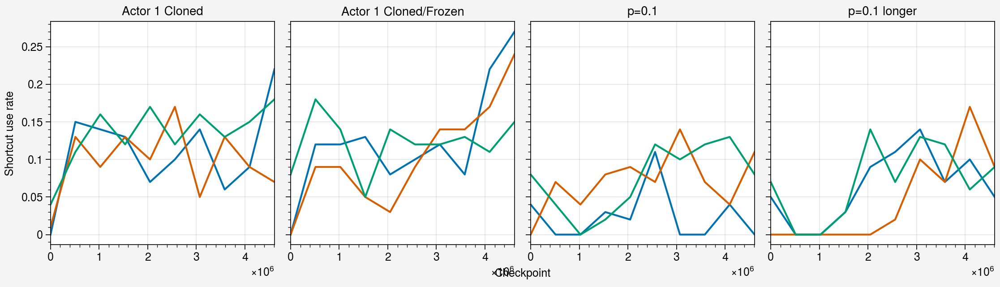

In [14]:
fig, ax = pplt.subplots(ncols=4)
xs = chks * 256 * 100
for i in range(3):
    ax[0].plot(xs, all_surs['cloactor0'][i])
    ax[1].plot(xs, all_surs['clofractor0'][i])
    ax[2].plot(xs, all_surs['p0.1'][i])
    ax[3].plot(xs, all_surs['p0.1_longer'][i])
    
    
ax.format(xlabel='Checkpoint', ylabel='Shortcut use rate', 
          title=['Actor 1 Cloned', 'Actor 1 Cloned/Frozen', 'p=0.1', 'p=0.1 longer'])


In [13]:
chks2 = np.arange(0, 1100, 100)
surs = []
for trial in range(3):
    sur = []
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm_wc1.5p0.1batch256longer', chk=chk,
                 subdir='shortcut_wc', trial=trial)
        score = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
        sur.append(score)
    surs.append(sur)

all_surs['p0.1_longer'] = surs
pickle.dump(all_surs, open('data/shortcut/clone_surs/wc1.5_closurs', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:10<00:00, 13.08s/it]


In [3]:
surs = defaultdict(list)
clone_sets = ['cloactor0', 'clofractor0',  'cloactor1', 'clofractor1']
for clone in clone_sets:
    for trial in range(3):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc1.5p0.1batch256', chk=190,
                 subdir='shortcut_clonewc', trial=trial)
        sur = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
        surs[clone].append(sur)
        
print(surs)


defaultdict(<class 'list'>, {'cloactor0': [0.18, 0.15, 0.14], 'clofractor0': [0.34, 0.29, 0.16], 'cloactor1': [0.13, 0.08, 0.2], 'clofractor1': [0.03, 0.15, 0.16]})


In [8]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates',  'rb'))

for trial in range(3):
    sur = all_shortcut_use_rates[f'0.4_{trial}']

    print(sur[-1])
    

0.85
0.9
0.76


In [9]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates',  'rb'))

for trial in range(3):
    sur = all_shortcut_use_rates[f'0.1_{trial}']

    print(sur[-1])
    

0.09
0.04
0.06


In [11]:
for trial in range(3):
    model, obs_rms = load_chk(f'shortcut_nonorm_wc1.5p0.1batch256', chk=190,
             subdir='shortcut_wc', trial=trial)
    sur = test_shortcut_use_rate(model, obs_rms, env_kwargs={'wall_colors': 1.5})
    print(sur)


0.0
0.04
0.06



KeyboardInterrupt



In [5]:
surs2 = defaultdict(list)
clone_sets = ['cloactor0', 'clofractor0',  'cloactor1', 'clofractor1']
for clone in clone_sets:
    for trial in range(3):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc4p0.1batch256', chk=190,
                 subdir='shortcut_clonewc', trial=trial)
        sur = test_shortcut_use_rate(model, obs_rms)
        surs2[clone].append(sur)
        
print(surs2)


defaultdict(<class 'list'>, {'cloactor0': [0.71, 0.82, 0.65], 'clofractor0': [0.64, 0.0, 0.75], 'cloactor1': [0.86, 0.75, 0.88], 'clofractor1': [0.7, 0.31, 0.71]})


In [12]:
for trial in range(3):
    model, obs_rms = load_chk(f'shortcut_nonorm_wc4p0.1batch256', chk=190,
             subdir='shortcut_wc', trial=trial)
    sur = test_shortcut_use_rate(model, obs_rms)
    print(sur)


0.15
0.29
0.68


In [7]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc4_userates',  'rb'))

for trial in range(3):
    sur = all_shortcut_use_rates[f'64_0.4_{trial}']

    print(sur[-1])
    

0.84
0.93
0.91
